# Sommaire :


### <a href="#C1"> **Partie 1 : Contexte et Objectifs**</a>

 - Contexte
 - Objectifs

<b><hr></b>

### <a href="#C2"> **Partie 2 : Mise en place de l'espace de travail**</a>
 - <a href="#C21"> 2.1 Import des packages</a>
 - <a href="#C22"> 2.2 Repertoire de travail</a>
 - <a href="#C23"> 2.3 Import des datas frames</a>

<b><hr></b>

### <a href="#C3"> **Partie 3 : Analyse exploratoire et etude des jeux de données EDA**</a>
 - <a href="#C31"> 3.1 Display </a>
 - <a href="#C32"> 3.2 Structure du dataframes </a>
 - <a href="#C33"> 3.3 Les valeurs manquantes et les doublons du dataframes </a>
 - <a href="#C34"> 3.4 Data inspections </a>
 - <a href="#C35"> 3.5 Data Visualisation Multivariée </a>
 - <a href="#C36"> 3.6 Normalité </a>
 - <a href="#C37"> 3.7 Multi Colinéarité </a>
    
<b><hr></b>
 
### <a href="#C4"> **Partie 4 : Cleaning**</a>
 - <a href="#C41"> 4.1 Imputer missing Values</a>
 - <a href="#C42"> 4.2 Encoding object colonnes (LabelEncoding/OrdinalEncoder/OneHotEncoding) </a>
 - <a href="#C43"> 4.3 Export csv</a>
 
<b><hr></b>

### <a href="#C5"> **Partie 5 : Conclusion**</a>


# <a name="C1">**Partie 1 : Contexte et Objectifs**</a> 

Contexte

Vous travaillez pour la ville de Seattle. 
Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, 
votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.

Des relevés minutieux ont été effectués par les agents de la ville en 2016. <br>
Voici la <a href = "https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy">source des données</a>. 

Objectifs

# <a name="C2"><font color='blue'>**Partie 2 : Mise en place de l'espace de travail**</font></a> 

### <a name="C21"><font color='blue'>2.1 Imports packages</font></a> 

###### <b><font color='blue'>2.1.0 Requirements</font></b>
- <b>Built-in</b>       : os, warnings
- <b>Data</b>           : pandas, numpy
- <b>Visualisations</b> : matplotlib, seaborn
- <b>Preprocessing</b>  : sklearn, scipy

###### <b><font color='blue'>2.1.1 Imports</font></b>

In [1]:
# Built-in
import os, warnings 

# Data
import numpy as np
import pandas as pd

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
#%matplotlib inline

# Imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer,KNNImputer,IterativeImputer

#Preprocessing
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder,StandardScaler,MinMaxScaler

#metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,accuracy_score

# feature selection
from sklearn.feature_selection import VarianceThreshold
from scipy.stats import entropy

### <a name="C22"><font color='blue'>2.2 Working directory</font></a> 

In [2]:
os.listdir()

['.git',
 '.gitignore',
 '.ipynb_checkpoints',
 '00_EDA P4.ipynb',
 '02_modelisation_consommation totale d’énergie.ipynb',
 '02_modelisation_emission de CO2.ipynb',
 'Brouillon.ipynb',
 'data',
 'ModeleCO2.ipynb',
 'README.md',
 'Untitled.ipynb']

In [3]:
os.listdir('data/source')

['2016_Building_Energy_Benchmarking.csv']

In [4]:
path = 'data/source/'
# A completer
filename = '2016_Building_Energy_Benchmarking.csv'

### <a name="C23"><font color='blue'>2.3 Import DataFrames</font></a> 

In [5]:
df = pd.read_csv(path+filename)

# <a name="C3"><font color='teal'>**Partie 3 : Analyse exploratoire et etude des jeux de données EDA**</font></a> 

### <a name="C31"><font color='teal'>3.1 Display</font></a>

In [6]:
df.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [7]:
df.sample(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
151,241,2016,NonResidential,Hotel,Hotel Nexus,2140 N. Northgate Way,Seattle,WA,98133.0,4468400005,...,7.680386e+05,2620548.0,35772.769530,3577277.0,False,NaN,Compliant,NaN,208.26,3.21
1103,20858,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Union Bay Lofts,3218 EASTLAKE AVE E,Seattle,WA,98102.0,1959703145,...,3.446753e+05,1176032.0,0.000000,0.0,False,NaN,Compliant,NaN,8.20,0.23
995,20444,2016,Multifamily LR (1-4),Low-Rise Multifamily,Fairway Apartments,4511 35th Ave SW,Seattle,WA,98126.0,0952008240,...,1.799662e+05,614045.0,0.000000,0.0,False,NaN,Compliant,NaN,4.28,0.15
1105,20868,2016,NonResidential,Large Office,Stone 34,3400 Stone Way N,Seattle,WA,98103.0,1825049072,...,1.055531e+06,3601473.0,8878.283203,887828.0,False,NaN,Compliant,NaN,72.26,0.35
2686,26600,2016,NonResidential,Mixed Use Property,Cadillac Hotel,319 2nd Avenue South,Seattle,WA,98104.0,5247800715,...,2.403461e+05,820061.0,2429.750000,242975.0,False,NaN,Compliant,NaN,18.62,0.72


### <a name="C32"><font color='teal'>3.2 Structure du dataframe</font></a> 

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

##### Filtrage des colonnes selon la consigne

In [9]:
df.drop(columns=['SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 
       'NaturalGas(therms)', 'NaturalGas(kBtu)', 'GHGEmissionsIntensity','SiteEnergyUse(kBtu)'],
       inplace=True)

In [10]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEnergyUseWN(kBtu)',
       'DefaultData', 'Comments', 'ComplianceStatus', 'Outlier',
       'TotalGHGEmissions'],
      dtype='object')

##### Suppression des batiments de type "habitation" selon la consigne

In [11]:
df.BuildingType.value_counts().sort_index()

Campus                    24
Multifamily HR (10+)     110
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
NonResidential          1460
Nonresidential COS        85
Nonresidential WA          1
SPS-District K-12         98
Name: BuildingType, dtype: int64

In [12]:
df = df.loc[~df.BuildingType.str.contains('Multifamily')]

In [13]:
# Distribution des types de variables
df.dtypes.value_counts(normalize=False)

object     15
float64    11
int64       8
bool        1
dtype: int64

In [14]:
df.nunique()

OSEBuildingID                      1668
DataYear                              1
BuildingType                          5
PrimaryPropertyType                  22
PropertyName                       1664
Address                            1647
City                                  1
State                                 1
ZipCode                              48
TaxParcelIdentificationNumber      1587
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           1497
Longitude                          1408
YearBuilt                           113
NumberofBuildings                    16
NumberofFloors                       45
PropertyGFATotal                   1590
PropertyGFAParking                  327
PropertyGFABuilding(s)             1585
ListOfAllPropertyUseTypes           373
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          1561
SecondLargestPropertyUseType         47
SecondLargestPropertyUseTypeGFA     699


### Drop Columns variance nulle ou faible

In [15]:
def drop_variance_null(data,v = 0):
    '''
    Select features whom std is less than v
    '''
    feature_to_drop = []
    
    if v == 0:
        v = 1.0e-10
    
    # Variables numeriques
    var0_num = data.std(numeric_only=True)<v
    for col in var0_num.index[var0_num]:
        feature_to_drop.append(col)
    
    # Variables non numeriques
    var0_cat = data.select_dtypes(exclude = np.number).nunique()==1
        
    for col in var0_cat.index[var0_cat]:
        feature_to_drop.append(col)
    
    return(feature_to_drop)

In [16]:
df.shape

(1668, 35)

In [17]:
col_to_drop = drop_variance_null(df)
col_to_drop

['DataYear', 'City', 'State']

In [18]:
#
df_cleaned = df.drop(columns=col_to_drop)

# Comment est toujour null
df_cleaned = df_cleaned.drop(columns='Comments')

In [19]:
df_cleaned.shape

(1668, 31)

### <a name="C33"><font color='teal'>3.3 Les valeurs manquantes et les doublons du dataframes</font></a> 

#### <font color='teal'>3.3.a Analyse des doublons du dataframes</font>

In [20]:
print("Il y a {} lignes dupliquées".format(df_cleaned.duplicated().sum()))

Il y a 0 lignes dupliquées


In [21]:
print("Il y a {} lignes dupliquées".format( df_cleaned.drop(columns="OSEBuildingID").duplicated().sum() ))
print("Il y a {} clés primaires dupliquées".format( df_cleaned["OSEBuildingID"].duplicated().sum() ))

Il y a 0 lignes dupliquées
Il y a 0 clés primaires dupliquées


In [22]:
# Modification de l'index du dataset
df_cleaned.set_index('OSEBuildingID',inplace=True)

In [23]:
df_cleaned.head(2)

,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUseWN(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,
1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,...,NaN,NaN,NaN,NaN,60.0,7456910.0,False,Compliant,NaN,249.98
2,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,...,15064.0,Restaurant,4622.0,NaN,61.0,8664479.0,False,Compliant,NaN,295.86


#### <font color='teal'>3.3.b Analyse et Traitement des valeurs manquantes du dataframes</font>

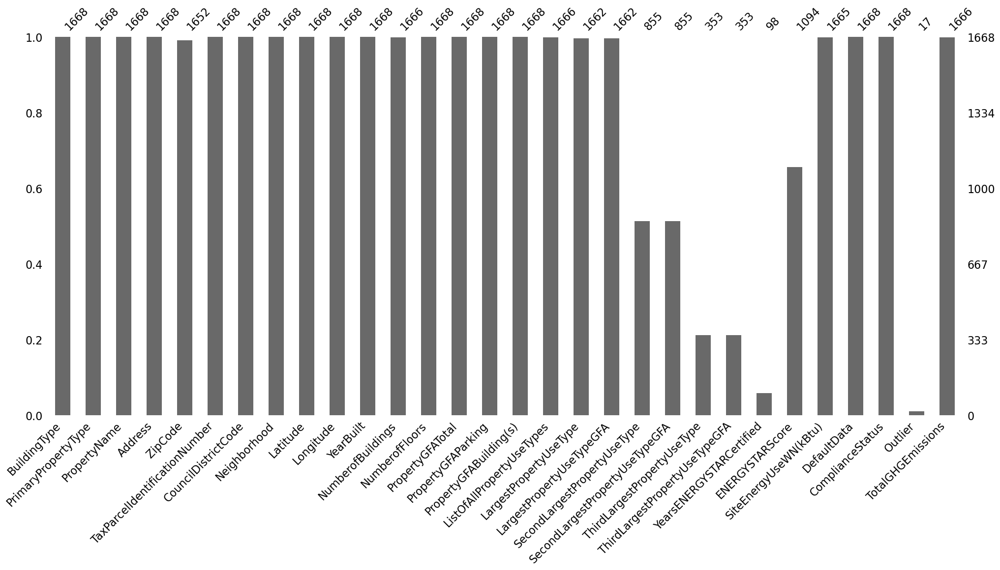

In [24]:
#les variables misc_data
import missingno as msno
msno.bar(df_cleaned);

#### les données manquantes des variables géographiques

###### ZipCode

In [25]:
# https://www.gps-coordinates.net/
# https://www.latlong.net/Show-Latitude-Longitude.html
# https://www.findlatitudeandlongitude.com/find-address-from-latitude-and-longitude/

df_cleaned.loc[df_cleaned.Address=='10510 5th Ave NE','ZipCode'] = 98125.0
df_cleaned.loc[df_cleaned.Address=='405 MLK Jr Way S','ZipCode'] = 98144.0
df_cleaned.loc[df_cleaned.Address=='8729 15th Ave NW','ZipCode'] = 98117.0
df_cleaned.loc[df_cleaned.Address=='2806 NE 127th St','ZipCode'] = 98125.0
df_cleaned.loc[df_cleaned.Address=='6020 28th ave NW','ZipCode'] = 98107.0
df_cleaned.loc[df_cleaned.Address=='1471 NW 67th St','ZipCode'] = 98117.0
df_cleaned.loc[df_cleaned.Address=='1403 w howe','ZipCode'] = 98119.0
df_cleaned.loc[df_cleaned.Address=='1400 E Galer St','ZipCode'] = 98112.0
df_cleaned.loc[df_cleaned.Address=='2323 East Cherry St','ZipCode'] = 98122.0
df_cleaned.loc[df_cleaned.Address=='4420 S Genesee','ZipCode'] = 98118.0
df_cleaned.loc[df_cleaned.Address=='6920 34th Ave SW','ZipCode'] = 98126.0
df_cleaned.loc[df_cleaned.Address=='1600 S Dakota St','ZipCode'] = 98108.0
df_cleaned.loc[df_cleaned.Address=='719 8th Ave S','ZipCode'] = 98114.0
df_cleaned.loc[df_cleaned.Address=='1920 1st Ave W','ZipCode'] = 98119.0
df_cleaned.loc[df_cleaned.Address=='8319 8th Ave S','ZipCode'] = 98108.0
df_cleaned.loc[df_cleaned.Address=='2820 S Myrtle St','ZipCode'] = 98108.0

In [26]:
# Convert ZipCode to string because its not numerical values
df_cleaned['ZipCode'] = df_cleaned.ZipCode.apply(int).apply(str)

###### SecondLargestPropertyUseType & ThirdLargestPropertyUseType

In [27]:
# If  SecondLargestPropertyUseType & ThirdLargestPropertyUseType sont manquant il seront remplacé par "void"

In [28]:
df.LargestPropertyUseType.nunique(),df.SecondLargestPropertyUseType.nunique(),df.ThirdLargestPropertyUseType.nunique()

(56, 47, 39)

In [29]:
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseType.isna(),'SecondLargestPropertyUseType'] = 'void'
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType.isna(),'ThirdLargestPropertyUseType'] = 'void'

###### SecondLargestPropertyUseTypeGFA & ThirdLargestPropertyUseTypeGFA

In [30]:
# remplacement des valeurs nulles par 0
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseTypeGFA.isna(),'SecondLargestPropertyUseTypeGFA'] = 0
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseTypeGFA.isna(),'ThirdLargestPropertyUseTypeGFA'] = 0

In [31]:
pd.cut(df_cleaned['PropertyGFABuilding(s)'] - df_cleaned.LargestPropertyUseTypeGFA - df_cleaned.SecondLargestPropertyUseTypeGFA - df_cleaned.ThirdLargestPropertyUseTypeGFA,bins = [-2000000,-500000,-250000,-40000,-500,500,40000,250000,500000,2000000]).value_counts(normalize=True).sort_index()

(-2000000, -500000]    0.002407
(-500000, -250000]     0.012034
(-250000, -40000]      0.089651
(-40000, -500]         0.235860
(-500, 500]            0.465704
(500, 40000]           0.181709
(40000, 250000]        0.011432
(250000, 500000]       0.001203
(500000, 2000000]      0.000000
dtype: float64

In [32]:
def compute_nb_mising_values(data):
    """
    Cree un dataframe pandas qui contient le nombre de valeurs par colonnes de l'argument data
    """
    valeurs = {}
    
    for col in data.columns:
        valeurs[col] = []
        valeurs[col].append(round((data[col].notna().sum()/data.shape[0])*100,2))
        valeurs[col].append(data[col].isna().sum())
        
    return pd.DataFrame.from_dict(data=valeurs, orient='index',
                                  columns = ["Taux de valeurs non nulles", "Nombre de valeurs manquantes"]
                                 ).sort_values(by="Nombre de valeurs manquantes",ascending=True)

In [33]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
ComplianceStatus,100.00,0
DefaultData,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
PropertyGFABuilding(s),100.00,0
PropertyGFATotal,100.00,0
NumberofFloors,100.00,0


#### <div class="alert alert-info"><font color='teal'> Suppression des colonnes dont plus de 50% des valeurs sont manquantes </font></div>

In [34]:
def drop_NA_columns(data,p):
    '''
    Select features who have more than p% if p<1 na value   
    Select feature contains more than p na value if p>1
    '''
    feature = []
    if p > 1 and p < 100:
        na_df = data.columns[data.isna().sum() > int(p)]
    
    if p <= 1 and p > 0:
        na_df = data.columns[data.isna().sum()/data.shape[0] > p]
    
    return(na_df)

In [35]:
# Ci dessous la liste des colonnes qui seront supprimées
drop_NA_columns(df_cleaned,p=0.49)

Index(['YearsENERGYSTARCertified', 'Outlier'], dtype='object')

In [36]:
col_to_drop = drop_NA_columns(df_cleaned,p=0.49)

In [37]:
df_cleaned.shape

(1668, 30)

In [38]:
df_cleaned = df_cleaned.drop(columns=col_to_drop,inplace=False)

In [39]:
df_cleaned.shape

(1668, 28)

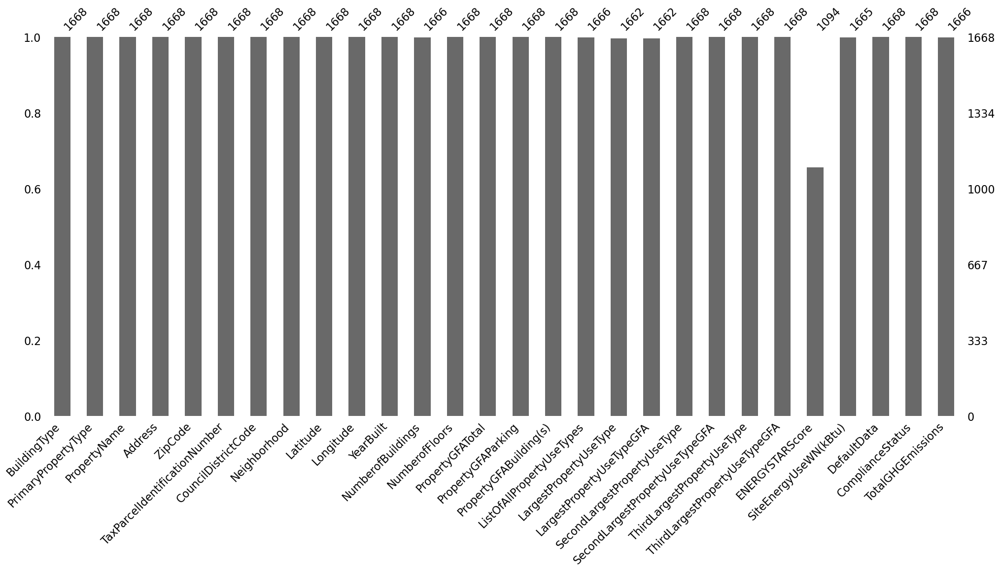

In [40]:
#les variables misc_data
import missingno as msno
msno.bar(df_cleaned);

In [41]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
DefaultData,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
PropertyGFABuilding(s),100.00,0
PropertyGFAParking,100.00,0
ComplianceStatus,100.00,0
NumberofFloors,100.00,0


#### <font color='teal'> Imputation des données manquantes Categorielle</font>

In [42]:
from sklearn.preprocessing import StandardScaler

In [43]:
%%time
from sklearn.model_selection import KFold


def do_cross_validation_Cat(df,imputer, print_model=False,Nbsplit = 6):
    
    # Deux imputer fourni par sklearn seront testés.
    # Un jeu d'entrainement A qui représente 20% sera tiré de façon aléatoire à partir de notre dataset.
    # Des valeurs manquantes seront générées aléatoirement dans A.
    # La metrique de comparaison des imputer sera le RMSE et le MAE.

    ## Create dataset without Nas
    na_df = df.select_dtypes(exclude=np.number).dropna().copy().values

    # Create Index
    idNan = np.arange(na_df.size)

    # Generate idx Nas
    idNan = np.random.choice(idNan, size=round((na_df.shape[0] * na_df.shape[1])*0.2), replace=False)

    ## Create train Nas dataset
    Xna = na_df.ravel()
    Xna = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna) ]).reshape(na_df.shape)
    
    # cross validate
    kf = KFold(n_splits=Nbsplit)
    
    # list des score
    score_rmse = []
    score_mae = []
    
    for train, test in kf.split(na_df):
        # Create Index
        idNan = train.size

        # Generate idx Nas
        idNan = np.random.choice(idNan, size=int(round(len(train)*0.4,0)), replace=False)

        ## Create train Nas dataset
        Xna_train = na_df[train].ravel()
        Xna_train = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_train) ]).reshape(na_df[train].shape)
        
        ## Create test Nas dataset
        Xna_test = na_df[test].ravel()
        Xna_test = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_test) ]).reshape(na_df[test].shape)
        
        
        ## Fit imputer
        imputer.fit( Xna_train )
        
        ## transform X
        X_Imputer = imputer.transform( Xna_test )

        score_accuracy.append( accuracy_score( na_df[test].ravel() , X_Imputer.ravel(), normalize=True)  )
        
        
    mean_accuracy = np.mean(score_accuracy)
    
    std_accuracy = np.std(score_accuracy)
    
    scoresAccuracy = ' + '.join(f'{s:.2f}' for s in score_accuracy)
    msg = f'Cross-validated rmse: ({scoresAccuracy}) / 3 = {mean_accuracy:.2f}'
    
    if print_model:
        msg = f'{imputer}:\n\t{msg}\n'
    
    print(msg)

Wall time: 0 ns


##### count le nombre de modalité  des colonne LargestPropertyUseType et ListOfAllPropertyUseTypes

In [44]:
df_cleaned.LargestPropertyUseType.nunique()

56

In [45]:
df_cleaned.ListOfAllPropertyUseTypes.nunique()

373

In [46]:
# Display des batiments dont l'info LargestPropertyUseType est manquant 
df_cleaned.loc[df_cleaned.LargestPropertyUseType.isna(),['BuildingType','PrimaryPropertyType','CouncilDistrictCode','PropertyGFABuilding(s)','ListOfAllPropertyUseTypes','LargestPropertyUseType','SecondLargestPropertyUseType']]

,BuildingType,PrimaryPropertyType,CouncilDistrictCode,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType
OSEBuildingID,,,,,,,
496,NonResidential,Self-Storage Facility,6,111445,"Fitness Center/Health Club/Gym, Office, Other ...",NaN,void
773,NonResidential,Small- and Mid-Sized Office,7,63150,NaN,NaN,void
21103,NonResidential,Hotel,7,61721,Hotel,NaN,void
25568,NonResidential,Small- and Mid-Sized Office,4,48350,Office,NaN,void
25711,NonResidential,Restaurant,2,28800,Restaurant,NaN,void
26532,NonResidential,Mixed Use Property,4,20760,NaN,NaN,void


In [47]:
df_cleaned.shape

(1668, 28)

In [48]:
#df_cleaned = df_cleaned.loc[df_cleaned.LargestPropertyUseType.notna()]
df_cleaned['LargestPropertyUseType'].fillna(df_cleaned['LargestPropertyUseType'].mode())
df_cleaned.shape

(1668, 28)

#### <font color='teal'> Imputation des données numériques manquantes</font>

In [49]:
%%time
from sklearn.model_selection import KFold

def do_cross_validation_Num(df,imputer, print_model=False,Nbsplit = 6):
    
    
    # Deux imputer fourni par sklearn seront testés.
    # Un jeu d'entrainement A qui représente 20% sera tiré de façon aléatoire à partir de notre dataset.
    # Des valeurs manquantes seront générées aléatoirement dans A.
    # La metrique de comparaison des imputer sera le RMSE et le MAE.

    ## Create dataset without Nas
    na_df = df.select_dtypes(include=np.number).dropna().copy()

    # Scaling Data
    Scaler = StandardScaler().fit(na_df)
    na_df = Scaler.transform(na_df)

    # Create Index
    idNan = np.arange(na_df.size)

    # Generate idx Nas
    idNan = np.random.choice(idNan, size=round((na_df.shape[0] * na_df.shape[1])*0.2), replace=False)

    ## Create train Nas dataset
    Xna = na_df.ravel()
    Xna = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna) ]).reshape(na_df.shape)
    
    # shape 
    n = na_df.shape[0]
    p = na_df.shape[1]
    
    # cross validate
    kf = KFold(n_splits=Nbsplit)
    
    # list des score
    score_rmse = []
    score_mae = []
    
    for train, test in kf.split(na_df):
        # Create Index
        idNan = train.size

        # Generate idx Nas
        idNan = np.random.choice(idNan, size=int(round(len(train)*0.4,0)), replace=False)

        ## Create train Nas dataset
        Xna_train = na_df[train].ravel()
        Xna_train = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_train) ]).reshape(na_df[train].shape)
        
        ## Create test Nas dataset
        Xna_test = na_df[test].ravel()
        Xna_test = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_test) ]).reshape(na_df[test].shape)
        
        
        ## Fit imputer
        imputer.fit( Xna_train )
        
        ## transform X
        X_Imputer = imputer.transform( Xna_test )

        score_rmse.append( mean_squared_error( na_df[test].ravel() , X_Imputer.ravel() ) )
        score_mae.append( mean_absolute_error( na_df[test].ravel() , X_Imputer.ravel() ) )
        
    mean_rmse = np.mean(score_rmse)
    mean_mae  = np.mean(score_mae)
    
    std_rmse = np.std(score_rmse)
    std_mae  = np.std(score_mae)
    
    scoresRMSE = ' + '.join(f'{s:.2f}' for s in score_rmse)
    scoresMAE = ' + '.join(f'{s:.2f}' for s in score_mae)
    msg = f'Cross-validated rmse: ({scoresRMSE}) / 3 = {mean_rmse:.2f}'
    
    if print_model:
        msg = f'{imputer}:\n\t{msg}\n'
    
    print(msg)

Wall time: 0 ns


In [50]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = SimpleImputer( strategy='mean'), 
                        print_model=False,
                        Nbsplit = 6)

Cross-validated rmse: (0.40 + 0.25 + 0.11 + 0.05 + 0.17 + 0.09) / 3 = 0.18


In [51]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=3, weights="distance"),
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.11 + 0.14 + 0.11 + 0.05 + 0.09 + 0.06) / 3 = 0.09


In [52]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=5, weights="distance"), 
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.30 + 0.10 + 0.07 + 0.03 + 0.15 + 0.18) / 3 = 0.14


In [53]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=10, weights="distance"), 
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.08 + 0.15 + 0.07 + 0.04 + 0.07 + 0.08) / 3 = 0.08


In [54]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = IterativeImputer(max_iter=500, random_state=0),
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.13 + 0.24 + 0.13 + 0.04 + 0.05 + 0.10) / 3 = 0.12


###### <font color='teal'>Selection de l'algorithme d'imputation</font>

In [55]:
df_cleaned.select_dtypes(exclude = np.number).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1668 entries, 1 to 50226
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   BuildingType                   1668 non-null   object
 1   PrimaryPropertyType            1668 non-null   object
 2   PropertyName                   1668 non-null   object
 3   Address                        1668 non-null   object
 4   ZipCode                        1668 non-null   object
 5   TaxParcelIdentificationNumber  1668 non-null   object
 6   Neighborhood                   1668 non-null   object
 7   ListOfAllPropertyUseTypes      1666 non-null   object
 8   LargestPropertyUseType         1662 non-null   object
 9   SecondLargestPropertyUseType   1668 non-null   object
 10  ThirdLargestPropertyUseType    1668 non-null   object
 11  DefaultData                    1668 non-null   bool  
 12  ComplianceStatus               1668 non-null   object
dtypes:

In [56]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
DefaultData,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
PropertyGFABuilding(s),100.00,0
PropertyGFAParking,100.00,0
ComplianceStatus,100.00,0
NumberofFloors,100.00,0


### <a name="C34"><font color='teal'>3.4 Data inspections</font></a> 

In [57]:
def plot_kde(feature,log_ = True):
    X = df_cleaned.copy()
    if log_:
        X['TotalGHGEmissions'] = np.log1p(X['TotalGHGEmissions'])
        X['SiteEnergyUseWN(kBtu)'] = np.log1p(X['SiteEnergyUseWN(kBtu)'])
    
    fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
    
    sns.kdeplot(data=X,x ='TotalGHGEmissions',hue= feature,ax=axes[0])
    axes[0].set_title(f'TotalGHGEmissions')
    sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))
    
    sns.kdeplot(data=X,x ='SiteEnergyUseWN(kBtu)',hue= feature,ax=axes[1],legend = False)
    axes[1].set_title(f'SiteEnergyUseWN(kBtu)')
    
    plt.xlabel('')

In [58]:
# Inspections des données numériques
df_cleaned.describe()

,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions
count,1668.000000,1668.000000,1668.000000,1668.000000,1666.000000,1668.000000,1.668000e+03,1668.000000,1.668000e+03,1.662000e+03,1668.000000,1668.000000,1094.000000,1.665000e+03,1666.000000
mean,4.356715,47.616054,-122.332908,1961.913669,1.168667,4.121103,1.188427e+05,12897.979017,1.059447e+05,9.876469e+04,18865.442025,3158.194484,65.449726,8.064790e+06,184.973301
std,2.191048,0.048168,0.024580,32.741755,2.931409,6.563407,2.973622e+05,42274.511185,2.842116e+05,2.767111e+05,53270.976590,17971.917751,28.492928,2.203878e+07,751.976001
min,1.000000,47.499170,-122.411820,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,0.000000e+00,-0.800000
25%,2.000000,47.585458,-122.343280,1930.000000,1.000000,1.000000,2.947775e+04,0.000000,2.847525e+04,2.552750e+04,0.000000,0.000000,48.000000,1.294615e+06,19.967500
50%,4.000000,47.612340,-122.332935,1965.000000,1.000000,2.000000,4.928950e+04,0.000000,4.739150e+04,4.377050e+04,0.000000,0.000000,73.000000,2.685146e+06,49.580000
75%,7.000000,47.649675,-122.321675,1989.000000,1.000000,4.000000,1.053250e+05,0.000000,9.475975e+04,9.198375e+04,12656.000000,0.000000,89.000000,7.109712e+06,142.382500
max,7.000000,47.733870,-122.258640,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,686750.000000,459748.000000,100.000000,4.716139e+08,16870.980000


In [59]:
# Inspections des données non numériques
df_cleaned.select_dtypes(exclude=np.number).describe()

,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,DefaultData,ComplianceStatus
count,1668,1668,1668,1668,1668,1668,1668,1666,1662,1668,1668,1668,1668
unique,5,22,1664,1647,48,1587,19,373,56,48,40,2,4
top,NonResidential,Small- and Mid-Sized Office,South Park,2600 SW Barton St,98134,1625049001,DOWNTOWN,Office,Office,void,void,False,Compliant
freq,1460,292,2,4,182,8,361,138,497,813,1315,1580,1548


In [60]:
df_cleaned.drop(columns=["CouncilDistrictCode",'PropertyName','TaxParcelIdentificationNumber'],inplace=True)

###### Etude de la colonne ListOfAllPropertyUseTypes

In [61]:
df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.lower()

df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.replace('repair services (vehicle, shoe, locksmith, etc)','repair services (vehicle shoe locksmith etc)',regex=False)
df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.replace('personal services (health/beauty, dry cleaning, etc)','personal services (health/beauty dry cleaning etc)',regex=False)

In [62]:
pd.options.display.max_colwidth = 400
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType == 'void',['ListOfAllPropertyUseTypes','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']]\
.loc[df_cleaned.ListOfAllPropertyUseTypes.apply(lambda x: len(str(x).split(', '))>2)].drop_duplicates()

,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
OSEBuildingID,,,,
393,"office, parking, personal services (health/beauty dry cleaning etc)",Parking,Office,void
496,"fitness center/health club/gym, office, other - education, other - recreation, other - restaurant/bar, outpatient rehabilitation/physical therapy, personal services (health/beauty dry cleaning etc), restaurant, retail store, self-storage facility, vocat",NaN,void,void


In [63]:
# Separer la colonnes ListOfAllPropertyUseTypes
complement = df_cleaned.ListOfAllPropertyUseTypes.str.split(', ',expand=True,).iloc[:,:6]

In [64]:
# Completer les "ThirdLargestPropertyUseType" qui sont manquant
df_cleaned.loc[((df_cleaned.ThirdLargestPropertyUseType=='void') & (~complement[2].isnull() ) ),'ThirdLargestPropertyUseType'] = complement.loc[((df_cleaned.ThirdLargestPropertyUseType=='void') & (~complement[2].isnull() ) ),2]

In [65]:
# Completer les "SecondLargestPropertyUseType" qui sont manquant
df_cleaned.loc[((df_cleaned.SecondLargestPropertyUseType=='void') & (~complement[1].isnull() ) ),'SecondLargestPropertyUseType'] = complement.loc[((df_cleaned.SecondLargestPropertyUseType=='void') & (~complement[1].isnull() ) ),1]

### Creation des colonnes FourthLargestPropertyUseType , FifthLargestPropertyUseType , SixthLargestPropertyUseType

In [66]:
df_cleaned[['FourthLargestPropertyUseType','FifthLargestPropertyUseType','SixthLargestPropertyUseType']] = complement.iloc[:,3:6]

In [67]:
df_cleaned.loc[df_cleaned.FourthLargestPropertyUseType.isnull(),['FourthLargestPropertyUseType']] = "void"
df_cleaned.loc[df_cleaned.FifthLargestPropertyUseType.isnull(),['FifthLargestPropertyUseType']] = "void"
df_cleaned.loc[df_cleaned.SixthLargestPropertyUseType.isnull(),['SixthLargestPropertyUseType']] = "void"

In [68]:
del complement

In [69]:
df_cleaned.drop(columns=['ListOfAllPropertyUseTypes'],inplace=True)
df_cleaned.shape

(1668, 27)

###### Etude de la colonne ComplianceStatus

In [70]:
df_cleaned.ComplianceStatus.str.lower().value_counts()

compliant                       1548
error - correct default data      88
non-compliant                     18
missing data                      14
Name: ComplianceStatus, dtype: int64

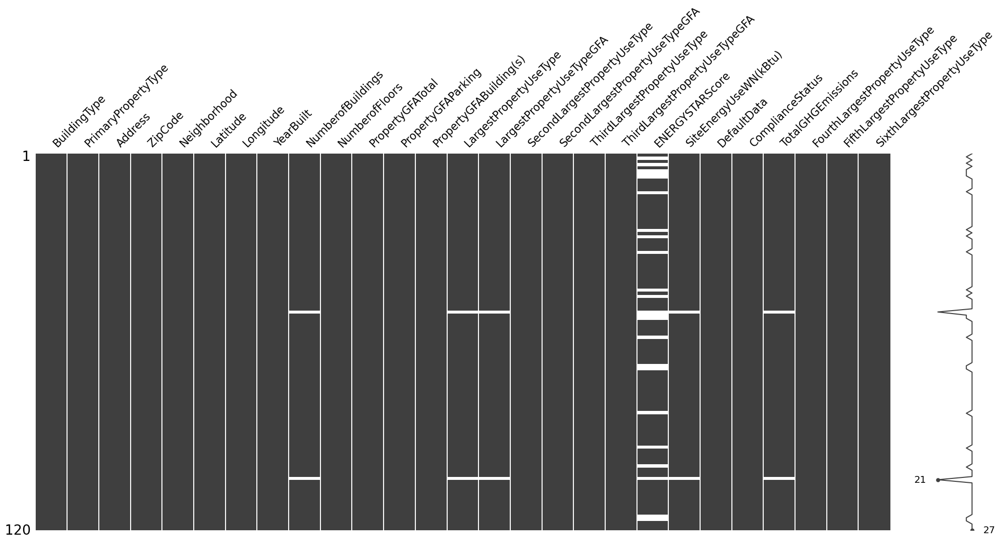

In [71]:
msno.matrix(df_cleaned[df_cleaned.ComplianceStatus!='Compliant']);

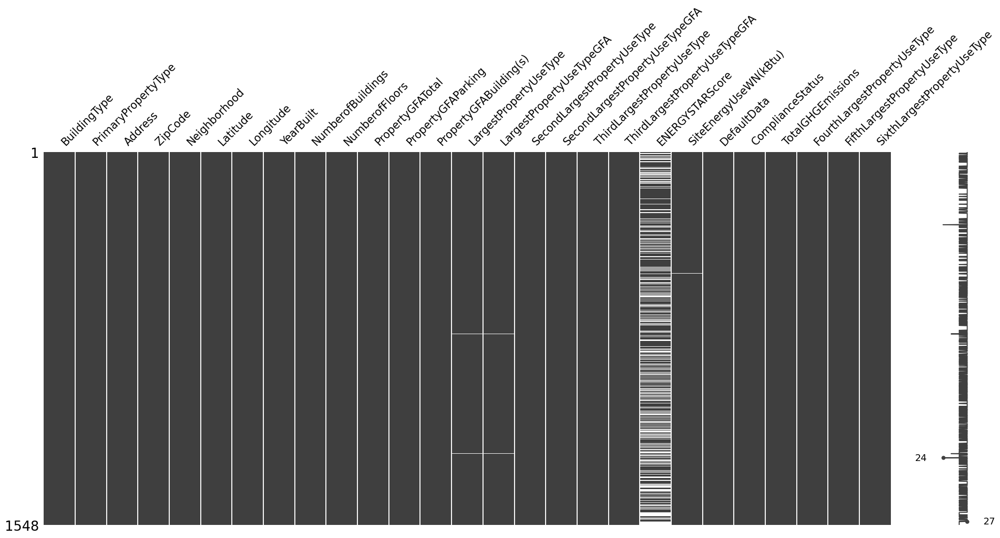

In [72]:
msno.matrix(df_cleaned[df_cleaned.ComplianceStatus=='Compliant']);

###### Suppression de lignes non Compliants

In [73]:
df_cleaned = df_cleaned.loc[df_cleaned.ComplianceStatus=='Compliant']
df_cleaned.shape

(1548, 27)

###### Creation de la colonne age à partir de YearBuilt

In [74]:
df_cleaned['Age'] = 2016-df_cleaned.YearBuilt
df_cleaned.drop(columns=['YearBuilt','ComplianceStatus'],inplace=True)
df_cleaned.shape

(1548, 26)

In [75]:
df_cleaned.select_dtypes(exclude=np.number).describe()

,BuildingType,PrimaryPropertyType,Address,ZipCode,Neighborhood,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,DefaultData,FourthLargestPropertyUseType,FifthLargestPropertyUseType,SixthLargestPropertyUseType
count,1548,1548,1548,1548,1548,1544,1548,1548,1548,1548,1548,1548
unique,5,21,1527,48,19,55,49,42,1,25,17,13
top,NonResidential,Small- and Mid-Sized Office,309 South Cloverdale Street,98134,DOWNTOWN,Office,void,void,False,void,void,void
freq,1432,286,4,180,351,485,705,1198,1548,1408,1486,1524


In [76]:
#Suppression de DefaultData qui est une variable constante
df_cleaned.drop(columns=['DefaultData'],inplace=True)
df_cleaned.shape

(1548, 25)

###### Etude des variables catégorielles

#### BuildingType

In [77]:
df_cleaned.BuildingType.str.lower().value_counts()

nonresidential        1432
nonresidential cos      81
campus                  24
sps-district k-12       10
nonresidential wa        1
Name: BuildingType, dtype: int64

#### Regroupement des modalités rares
- Nonresidential WA

In [78]:
df_cleaned.select_dtypes(exclude=np.number).loc[df_cleaned.BuildingType=="Nonresidential WA"]

,BuildingType,PrimaryPropertyType,Address,ZipCode,Neighborhood,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,FourthLargestPropertyUseType,FifthLargestPropertyUseType,SixthLargestPropertyUseType
OSEBuildingID,,,,,,,,,,,
50101,Nonresidential WA,University,4331 Memorial Way NE,98195,NORTHEAST,College/University,void,void,void,void,void


In [79]:
# PrimaryPropertyType
print("La modalité la plus représenté parmi les batiment dt le PrimaryPropertyType = 'University' est :",
df_cleaned.loc[df_cleaned.PrimaryPropertyType=="University",'BuildingType'].value_counts().index[0])

# ListOfAllPropertyUseTypes
#print("La modalité la plus représenté parmi les batiment dt le ListOfAllPropertyUseTypes = 'College/University' est :",
#df_cleaned.loc[df_cleaned.ListOfAllPropertyUseTypes=="College/University",'BuildingType'].value_counts().index[0])

# LargestPropertyUseType
print("La modalité la plus représenté parmi les batiment dt le LargestPropertyUseType = 'College/University' est :",
      df_cleaned.loc[df_cleaned.LargestPropertyUseType=="College/University",'BuildingType'].value_counts().index[0]
     )

La modalité la plus représenté parmi les batiment dt le PrimaryPropertyType = 'University' est : NonResidential
La modalité la plus représenté parmi les batiment dt le LargestPropertyUseType = 'College/University' est : NonResidential


In [80]:
# Les deux valeurs sont proche donc sans crainte on peut remplacer "Nonresidential WA" par 'NonResidential'
df_cleaned.loc[df_cleaned.BuildingType=="Nonresidential WA",'BuildingType'] = 'NonResidential'

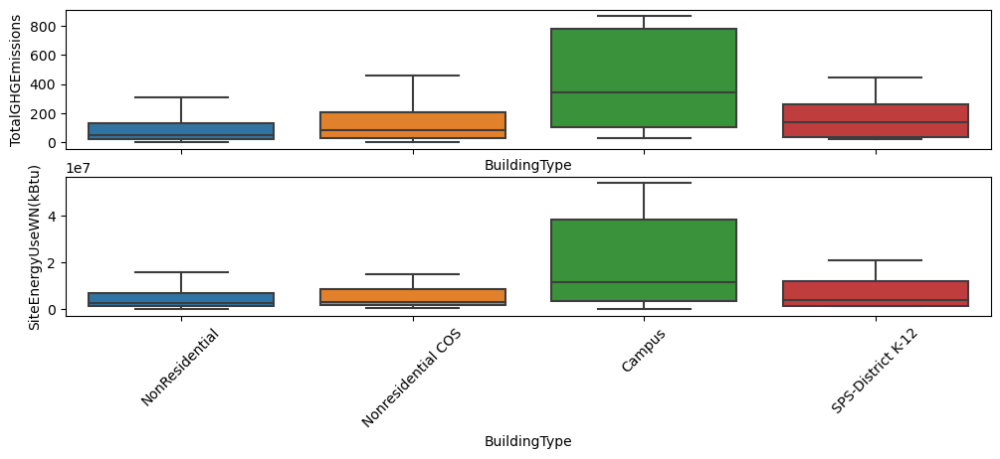

In [81]:
# BuildingType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='BuildingType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='BuildingType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

In [82]:
def plot_kde(feature,log_ = True):
    X = df_cleaned.copy()
    if log_:
        X['TotalGHGEmissions'] = np.log1p(X['TotalGHGEmissions'])
        X['SiteEnergyUseWN(kBtu)'] = np.log1p(X['SiteEnergyUseWN(kBtu)'])
    
    fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
    
    sns.kdeplot(data=X,x ='TotalGHGEmissions',hue= feature,ax=axes[0])
    axes[0].set_title(f'TotalGHGEmissions')
    sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))
    
    sns.kdeplot(data=X,x ='SiteEnergyUseWN(kBtu)',hue= feature,ax=axes[1],legend = False,warn_singular=False)
    axes[1].set_title(f'SiteEnergyUseWN(kBtu)')
    
    plt.xlabel('')

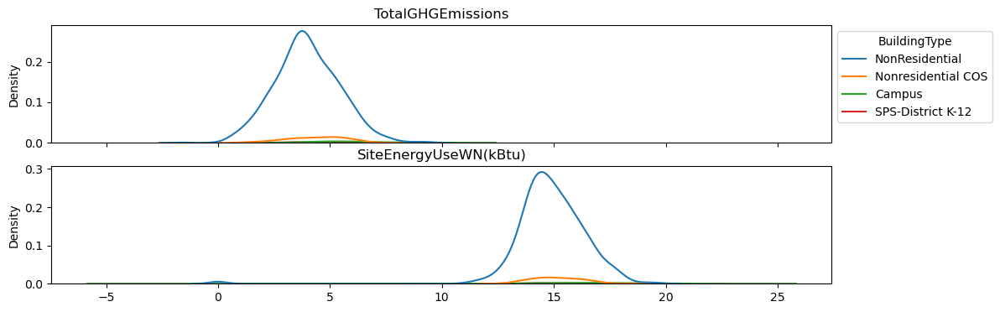

In [83]:
plot_kde('BuildingType',log_ = True)

##### Lattitude longitude

In [84]:
import plotly.express as px

color_scale = [(0, 'orange'), (1,'red')]
df_out = df_cleaned[df_cleaned['SiteEnergyUseWN(kBtu)'].notna()].dropna(axis='columns')

from sklearn.preprocessing import StandardScaler
elect_scalMM = (df_out['SiteEnergyUseWN(kBtu)'] - df_out['SiteEnergyUseWN(kBtu)'].mean(axis=0)) / (df_out['SiteEnergyUseWN(kBtu)'].std(axis=0))
fig = px.scatter_mapbox(df_out, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Address", 
                        hover_data=["Address", "SiteEnergyUseWN(kBtu)"],
                        color="SiteEnergyUseWN(kBtu)",
                        color_continuous_scale=color_scale,
                        size=elect_scalMM+1,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [85]:
import plotly.express as px

color_scale = [(0, 'orange'), (1,'red')]
df_out = df_cleaned[df_cleaned['TotalGHGEmissions'].notna()].dropna(axis='columns')

from sklearn.preprocessing import StandardScaler
elect_scalMM = (df_out['TotalGHGEmissions'] - df_out['TotalGHGEmissions'].mean(axis=0)) / (df_out['TotalGHGEmissions'].std(axis=0))
fig = px.scatter_mapbox(df_out, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Address", 
                        hover_data=["Address", "TotalGHGEmissions"],
                        color="TotalGHGEmissions",
                        color_continuous_scale=color_scale,
                        size=elect_scalMM+1,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

##### Address

In [86]:
df_cleaned.drop(columns=['Address'],inplace=True)
df_cleaned.shape

(1548, 24)

##### Neighborhood

In [87]:
df_cleaned.Neighborhood.str.lower().value_counts()

downtown                  351
greater duwamish          328
magnolia / queen anne     144
lake union                143
northeast                 117
east                      116
northwest                  78
ballard                    63
north                      59
central                    46
delridge                   40
southwest                  31
southeast                  31
delridge neighborhoods      1
Name: Neighborhood, dtype: int64

C:\Users\eleor\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



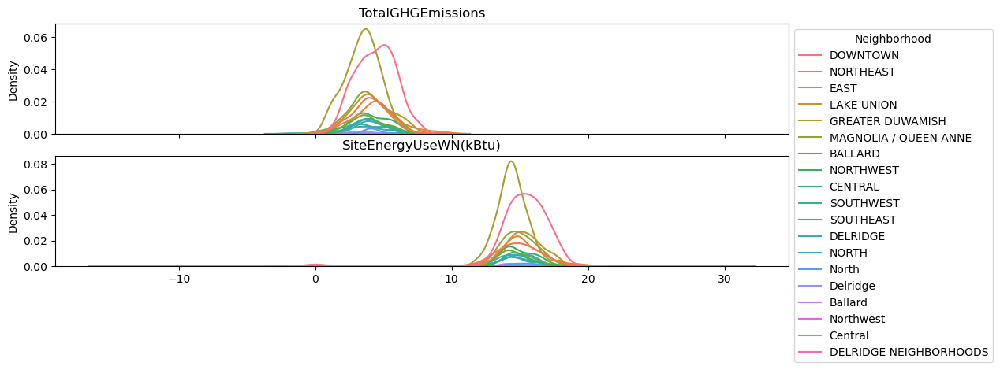

In [88]:
plot_kde('Neighborhood',log_ = True)

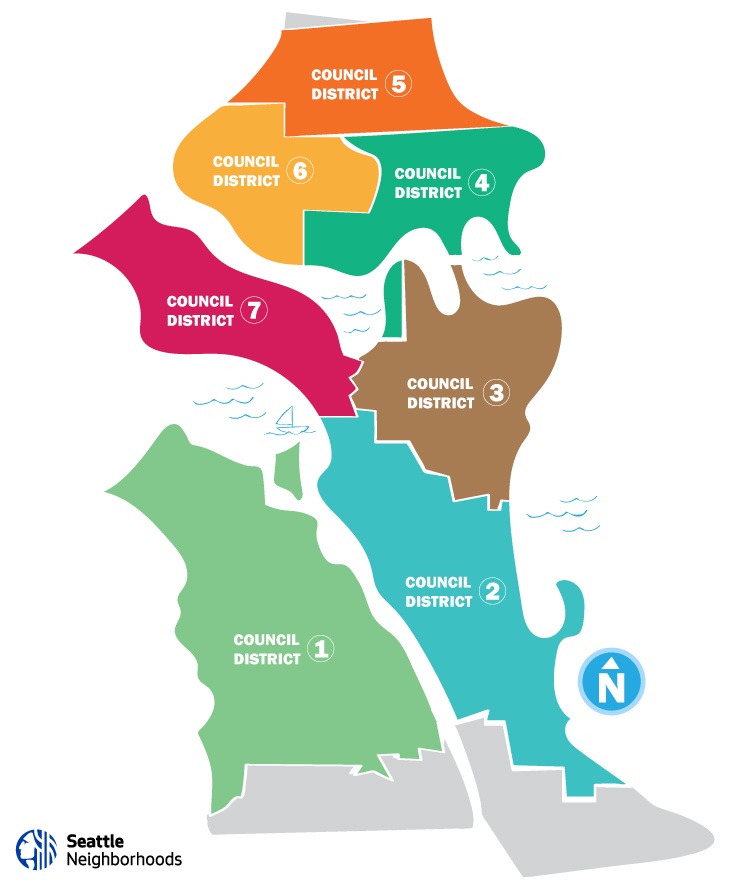

In [89]:
# On obtient 14 modalité en lower les valeurs
df_cleaned['Neighborhood'] = df_cleaned.Neighborhood.str.lower()
df_cleaned.loc[df_cleaned.Neighborhood=='delridge neighborhoods','Neighborhood'] = 'delridge'

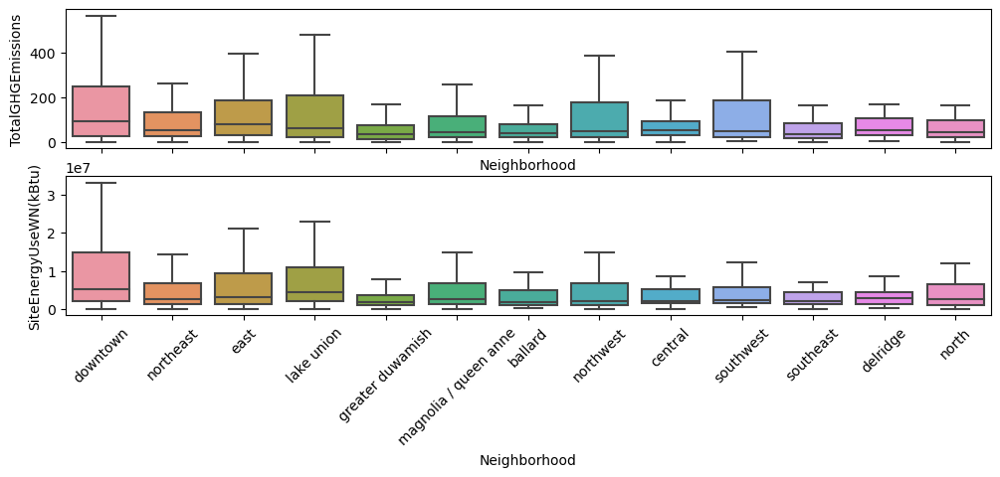

In [90]:
# Neighborhood
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='Neighborhood',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='Neighborhood',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

In [91]:
df_cleaned.PrimaryPropertyType.str.lower().value_counts()

small- and mid-sized office    286
other                          245
warehouse                      185
large office                   169
mixed use property             113
retail store                    85
hotel                           75
worship facility                69
distribution center             53
k-12 school                     50
supermarket / grocery store     40
medical office                  39
self-storage facility           28
university                      24
residence hall                  21
senior care community           20
refrigerated warehouse          12
restaurant                      12
hospital                        10
laboratory                      10
low-rise multifamily             2
Name: PrimaryPropertyType, dtype: int64

##### PrimaryPropertyType

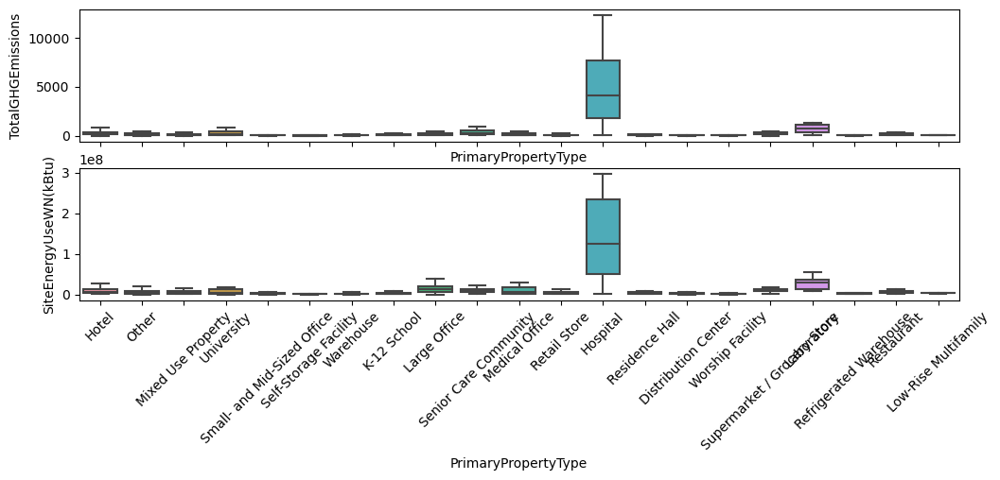

In [92]:
### PrimaryPropertyType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='PrimaryPropertyType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='PrimaryPropertyType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

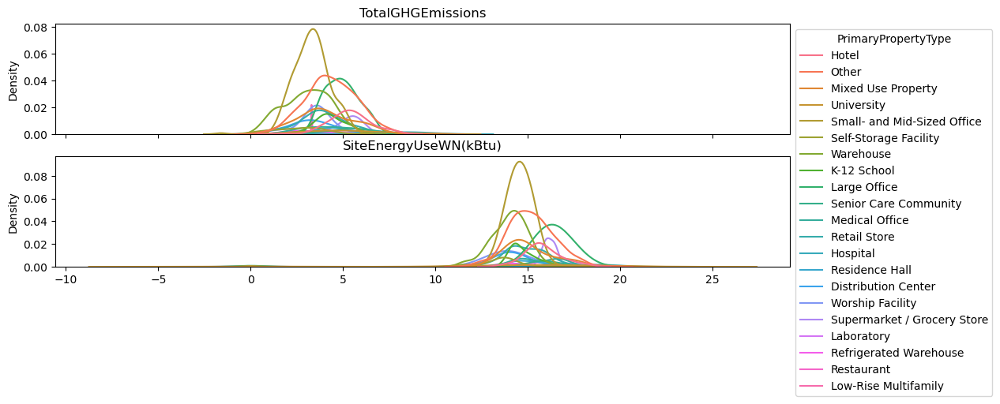

In [93]:
plot_kde('PrimaryPropertyType',log_ = True)

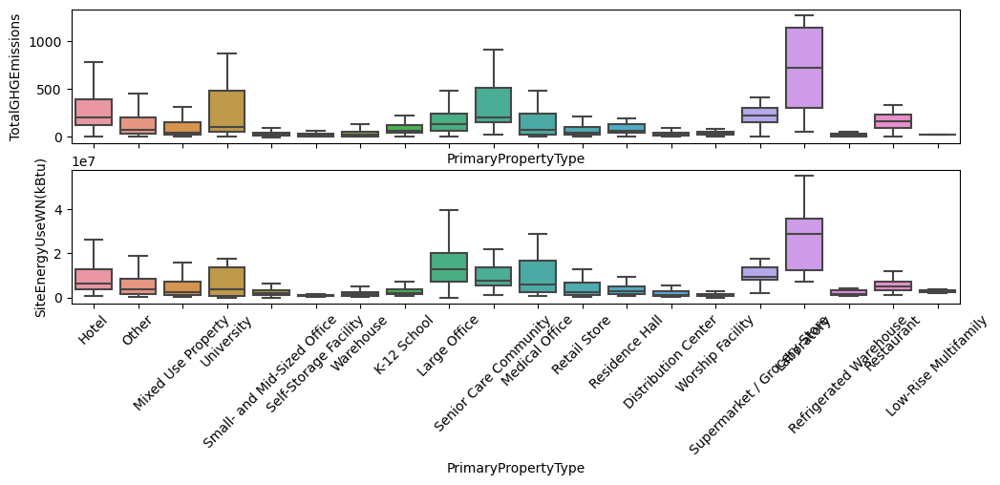

In [94]:
### PrimaryPropertyType sans la modalité "Hospital"
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned.loc[df_cleaned.PrimaryPropertyType != 'Hospital'],x='PrimaryPropertyType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned.loc[df_cleaned.PrimaryPropertyType != 'Hospital'],x='PrimaryPropertyType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

##### LargestPropertyUseType

In [95]:
df_cleaned['LargestPropertyUseType'] = df_cleaned.LargestPropertyUseType.str.lower()

In [96]:
df_cleaned.LargestPropertyUseType.str.lower().value_counts()

office                                                  485
non-refrigerated warehouse                              197
other                                                    95
retail store                                             93
hotel                                                    75
worship facility                                         69
distribution center                                      54
k-12 school                                              50
supermarket/grocery store                                41
medical office                                           41
other - recreation                                       31
parking                                                  30
self-storage facility                                    27
college/university                                       24
residence hall/dormitory                                 22
other - entertainment/public assembly                    21
senior care community                   

In [97]:
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'personal services (health/beauty, dry cleaning, etc)','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'movie theater','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'food service','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'police station','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'wholesale club/supercenter','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'residential care facility','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'courthouse','LargestPropertyUseType'] = 'data center'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'fire station','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'pre-school/daycare','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - utility','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'adult education','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - restaurant/bar','LargestPropertyUseType'] = 'restaurant'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - public services','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'lifestyle center','LargestPropertyUseType'] = 'other - mall'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'performing arts','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'library','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'financial office','LargestPropertyUseType'] = 'grouping'

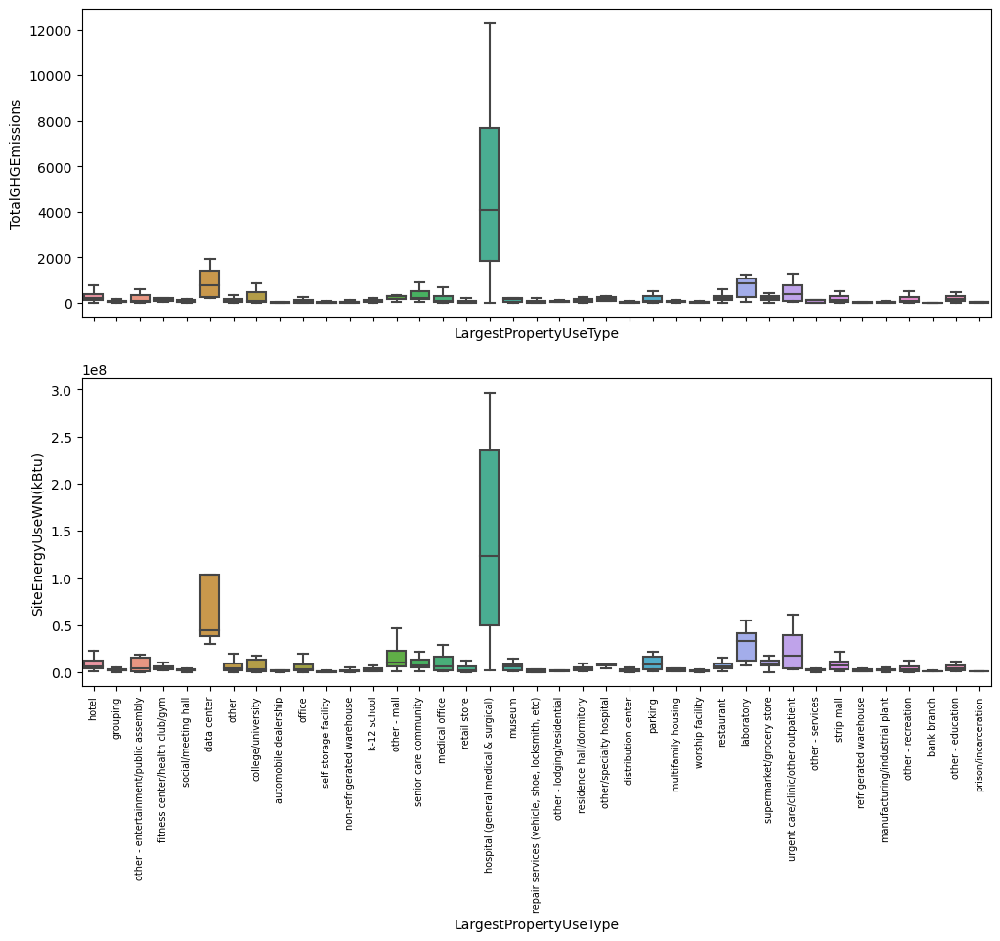

In [98]:
### LargestPropertyUseType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='LargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='LargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

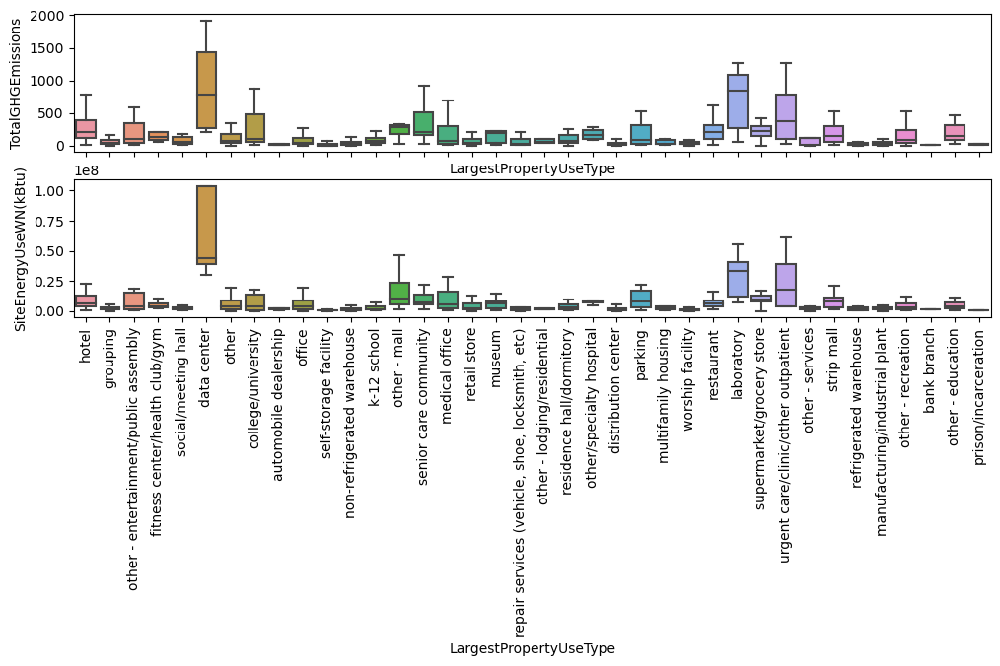

In [99]:
### LargestPropertyUseType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned.loc[df_cleaned.LargestPropertyUseType.str.lower() != 'hospital (general medical & surgical)'],x='LargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned.loc[df_cleaned.LargestPropertyUseType.str.lower() != 'hospital (general medical & surgical)'],x='LargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### SecondLargestPropertyUseType   

In [100]:
df_cleaned['SecondLargestPropertyUseType'] = df_cleaned.SecondLargestPropertyUseType.str.lower()

In [101]:
df_cleaned.SecondLargestPropertyUseType.str.lower().value_counts()

void                                                    705
parking                                                 331
office                                                  168
retail store                                             84
other                                                    43
restaurant                                               29
non-refrigerated warehouse                               28
fitness center/health club/gym                           16
multifamily housing                                      12
data center                                              12
other - services                                         11
supermarket/grocery store                                 9
laboratory                                                8
medical office                                            8
distribution center                                       7
other - entertainment/public assembly                     7
bank branch                             

In [102]:
mask = df_cleaned.SecondLargestPropertyUseType.value_counts().index[df_cleaned.SecondLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseType.apply(lambda x: x in mask),'SecondLargestPropertyUseType'] = 'grouping'

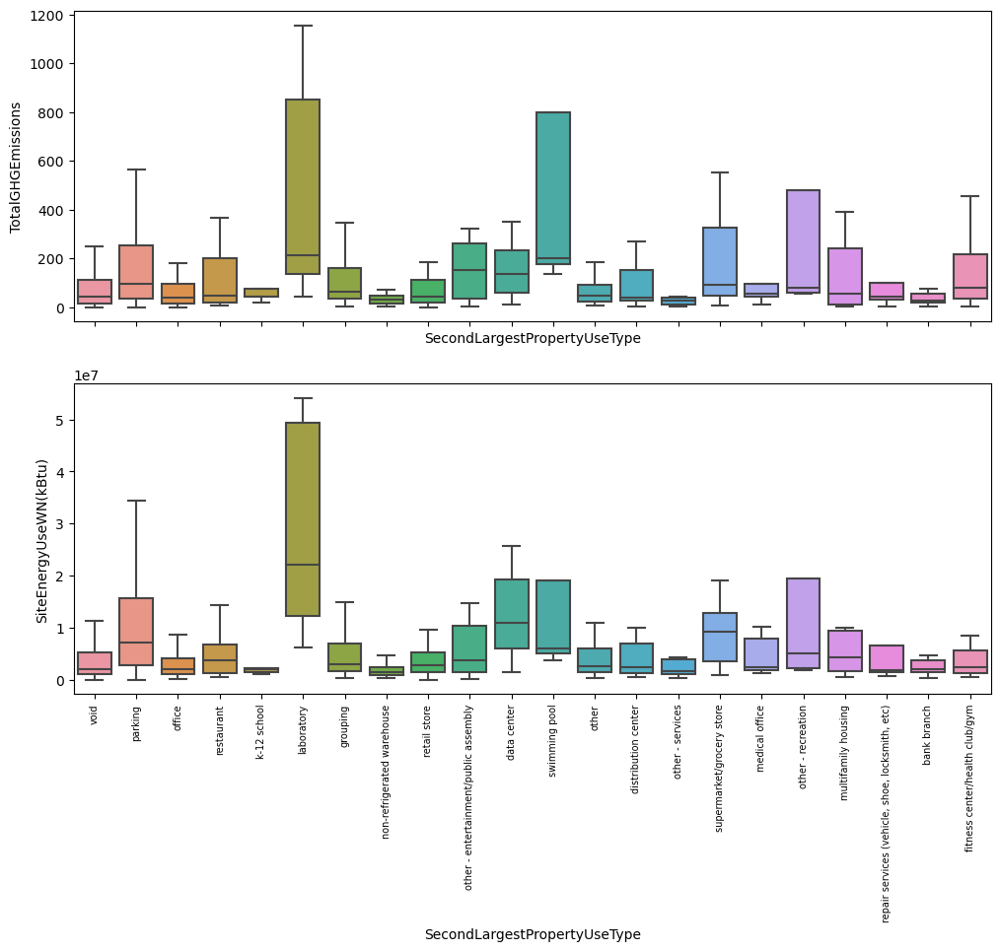

In [103]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='SecondLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='SecondLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### ThirdLargestPropertyUseType

In [104]:
df_cleaned['ThirdLargestPropertyUseType'] = df_cleaned.ThirdLargestPropertyUseType.str.lower()

In [105]:
df_cleaned.ThirdLargestPropertyUseType.value_counts()

void                                                    1198
office                                                    49
retail store                                              47
parking                                                   44
other                                                     39
restaurant                                                32
non-refrigerated warehouse                                14
data center                                               13
multifamily housing                                       12
swimming pool                                             10
medical office                                             9
social/meeting hall                                        8
food service                                               8
pre-school/daycare                                         8
bank branch                                                5
other - restaurant/bar                                     5
financial office        

In [106]:
mask = df_cleaned.ThirdLargestPropertyUseType.value_counts().index[df_cleaned.ThirdLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType.apply(lambda x: x in mask),'ThirdLargestPropertyUseType'] = 'grouping'

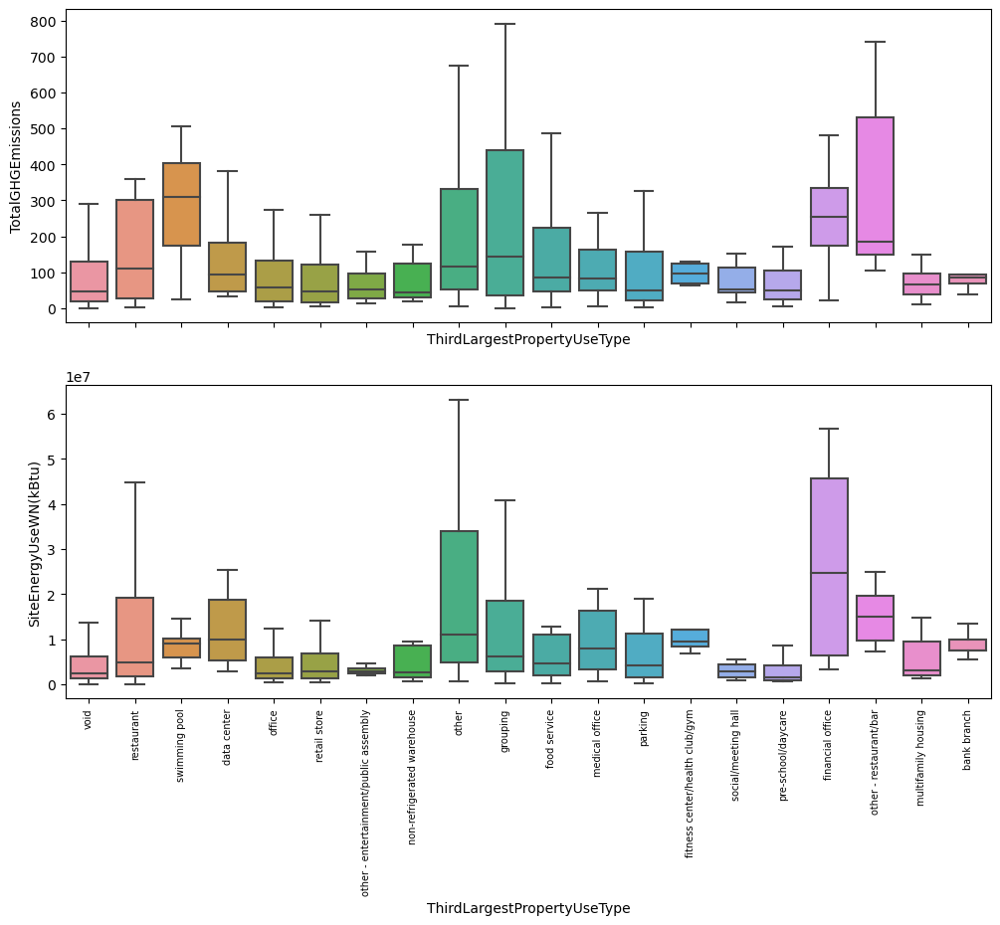

In [107]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='ThirdLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='ThirdLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### FourthLargestPropertyUseType

In [108]:
df_cleaned['FourthLargestPropertyUseType'] = df_cleaned.FourthLargestPropertyUseType.str.lower()

In [109]:
df_cleaned.FourthLargestPropertyUseType.value_counts()

void                                     1408
retail store                               34
parking                                    27
restaurant                                 21
other                                      11
other - recreation                          7
other - entertainment/public assembly       5
swimming pool                               5
office                                      3
residence hall/dormitory                    3
pre-school/daycare                          3
other - technology/science                  3
worship facility                            2
other - services                            2
other - utility                             2
other - education                           2
strip mall                                  2
self-storage facility                       1
fitness center/health club/gym              1
refrigerated warehouse                      1
other - restaurant/bar                      1
performing arts                   

In [110]:
mask = df_cleaned.FourthLargestPropertyUseType.value_counts().index[df_cleaned.FourthLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.FourthLargestPropertyUseType.apply(lambda x: x in mask),'FourthLargestPropertyUseType'] = 'grouping'

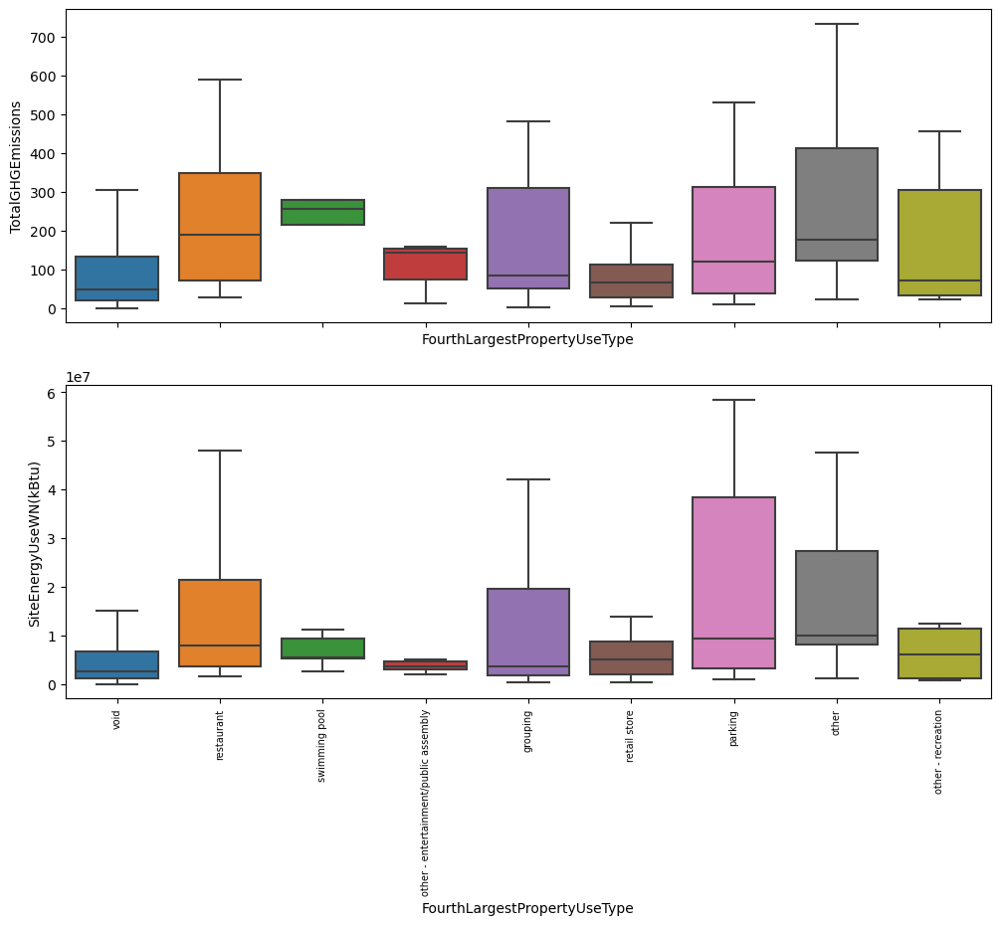

In [111]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='FourthLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='FourthLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### FifthLargestPropertyUseType

In [112]:
df_cleaned['FifthLargestPropertyUseType'] = df_cleaned.FifthLargestPropertyUseType.str.lower()

In [113]:
df_cleaned.FifthLargestPropertyUseType.value_counts()

void                                            1486
retail store                                      13
restaurant                                        12
parking                                           12
pre-school/daycare                                 4
social/meeting hall                                3
other - restaurant/bar                             3
supermarket/grocery store                          3
other                                              2
self-storage facility                              2
office                                             2
other - entertainment/public assembly              1
other - services                                   1
repair services (vehicle shoe locksmith etc)       1
other - recreation                                 1
urgent care/clinic/other outpatient                1
other - technology/science                         1
Name: FifthLargestPropertyUseType, dtype: int64

In [114]:
mask = df_cleaned.FifthLargestPropertyUseType.value_counts().index[df_cleaned.FifthLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.FifthLargestPropertyUseType.apply(lambda x: x in mask),'FifthLargestPropertyUseType'] = 'grouping'

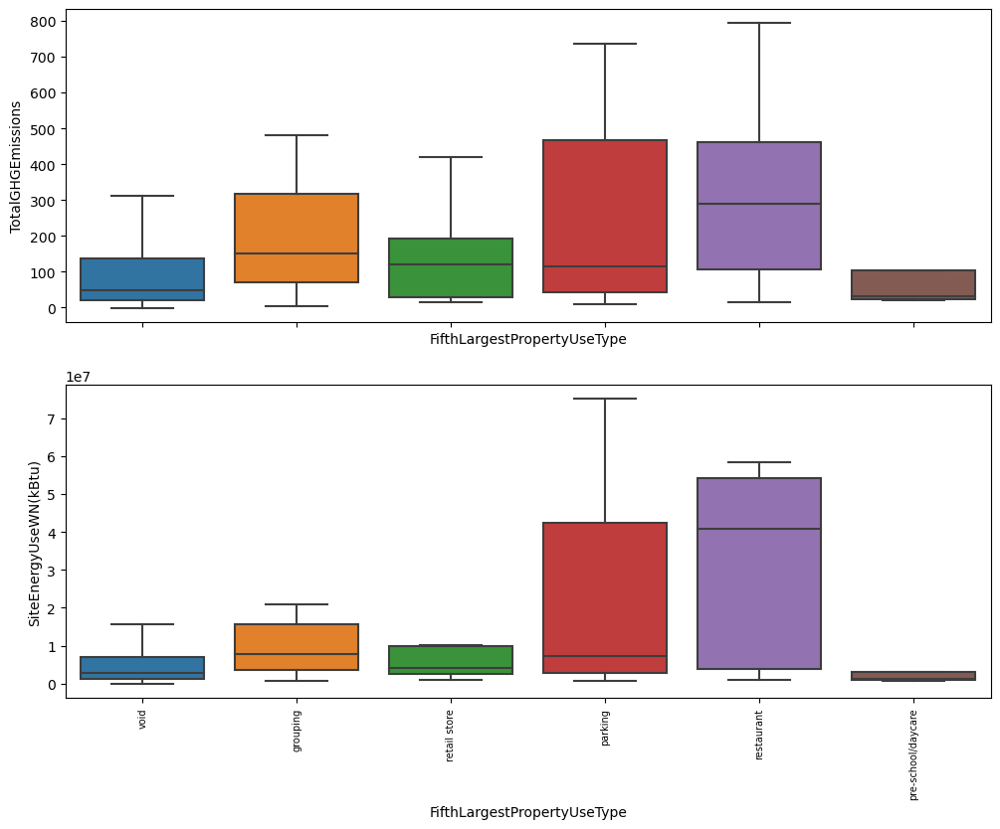

In [115]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='FifthLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='FifthLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### SixthLargestPropertyUseType

In [116]:
df_cleaned['SixthLargestPropertyUseType'] = df_cleaned.SixthLargestPropertyUseType.str.lower()

In [117]:
df_cleaned.SixthLargestPropertyUseType.value_counts()

void                                          1524
retail store                                     5
restaurant                                       5
pre-school/daycare                               3
parking                                          2
social/meeting hall                              2
senior care community                            1
other                                            1
outpatient rehabilitation/physical therapy       1
other - recreation                               1
worship facility                                 1
self-storage facility                            1
swimming pool                                    1
Name: SixthLargestPropertyUseType, dtype: int64

In [118]:
mask = df_cleaned.SixthLargestPropertyUseType.value_counts().index[df_cleaned.SixthLargestPropertyUseType.value_counts()<3].to_list()
df_cleaned.loc[df_cleaned.SixthLargestPropertyUseType.apply(lambda x: x in mask),'SixthLargestPropertyUseType'] = 'grouping'

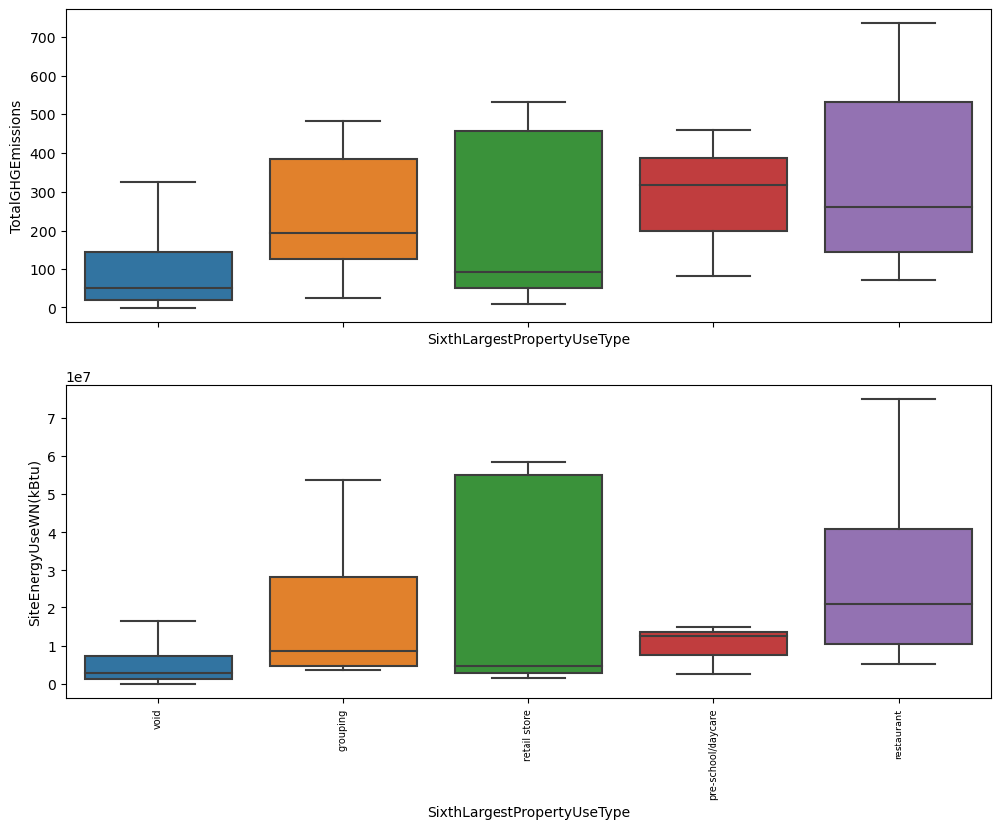

In [119]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='SixthLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='SixthLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### Zipcode

In [120]:
df_cleaned.ZipCode.value_counts()

98134    180
98104    153
98101    144
98109    138
98108    113
98122     87
98121     83
98105     80
98103     63
98119     61
98133     48
98107     48
98125     47
98144     43
98115     41
98118     32
98102     24
98106     22
98199     21
98126     19
98116     18
98112     18
98117     16
98195      9
98136      5
98155      4
98013      2
98114      2
98124      2
98168      2
98111      2
98146      2
98178      2
98154      2
98177      2
98020      1
98011      1
98165      1
98113      1
98181      1
98053      1
98006      1
98185      1
98164      1
98191      1
98070      1
98033      1
98145      1
Name: ZipCode, dtype: int64

In [121]:
mask = df_cleaned.ZipCode.value_counts().index[df_cleaned.ZipCode.value_counts()<10].to_list()
df_cleaned.loc[df_cleaned.ZipCode.apply(lambda x: x in mask),'ZipCode'] = 'grouping'

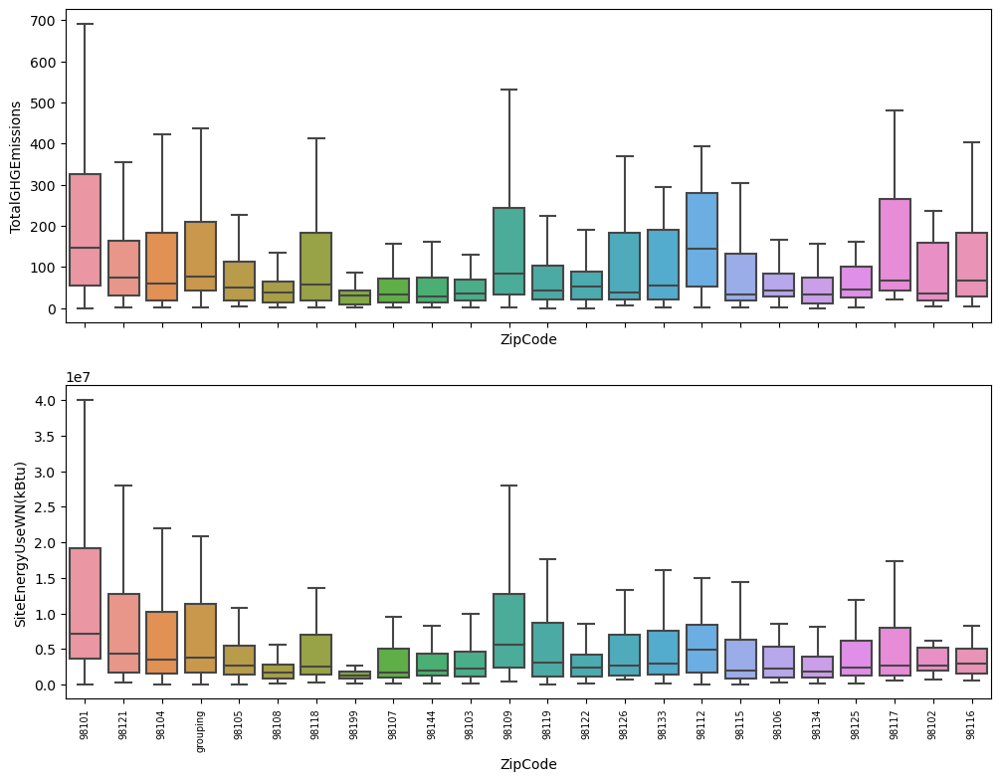

In [122]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='ZipCode',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='ZipCode',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

#### <font color='teal'> - 3.4.1 Data target numerique</font>

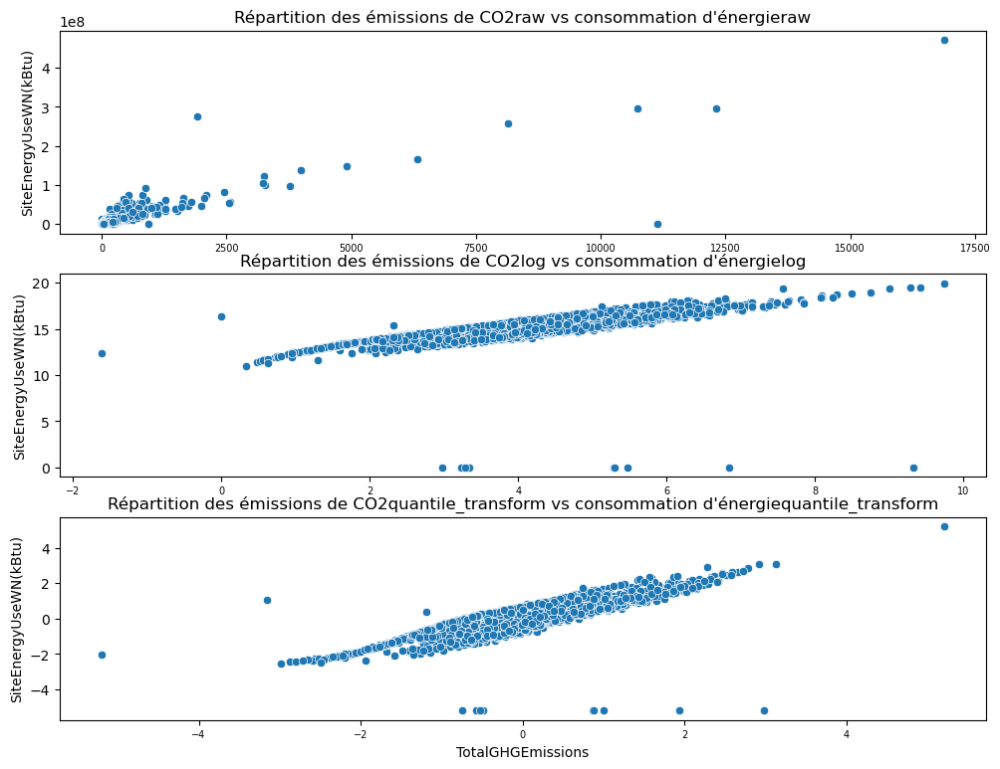

In [123]:
warnings.filterwarnings(action='ignore')
fig = plt.figure(figsize=(12, 9))

from sklearn.preprocessing import quantile_transform

for idx,tr in enumerate(['raw','log','quantile_transform']):
    if tr == 'raw':
        ax = fig.add_subplot(3,1, (idx+1))
        #h = ax.hist(df_cleaned[feat], bins=50, color='steelblue', density=True, edgecolor='none')
        sns.scatterplot(x=df_cleaned['TotalGHGEmissions'],y=df_cleaned['SiteEnergyUseWN(kBtu)'],ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))

        ax.xaxis.set_tick_params(labelsize=7)
        ax.set(xlabel='')

    if tr == 'log':
        ax = fig.add_subplot(3,1, (idx+1))
        sns.scatterplot(x=np.log1p(df_cleaned['TotalGHGEmissions']),y=np.log1p(df_cleaned['SiteEnergyUseWN(kBtu)']),ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))
        ax.xaxis.set_tick_params(labelsize=7)
        ax.set(xlabel='')

    if tr == 'quantile_transform':
        ax = fig.add_subplot(3,1, (idx+1))
        
        
        xx = pd.DataFrame(np.c_[quantile_transform(df_cleaned['TotalGHGEmissions'].values.reshape(-1, 1), output_distribution="normal", copy=True),
                            quantile_transform(df_cleaned['SiteEnergyUseWN(kBtu)'].values.reshape(-1, 1), output_distribution="normal", copy=True)],
                         columns=['TotalGHGEmissions','SiteEnergyUseWN(kBtu)'])
        
        sns.scatterplot(data = xx, x='TotalGHGEmissions',y='SiteEnergyUseWN(kBtu)', ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))
        ax.xaxis.set_tick_params(labelsize=7)

###### Etude distribution 

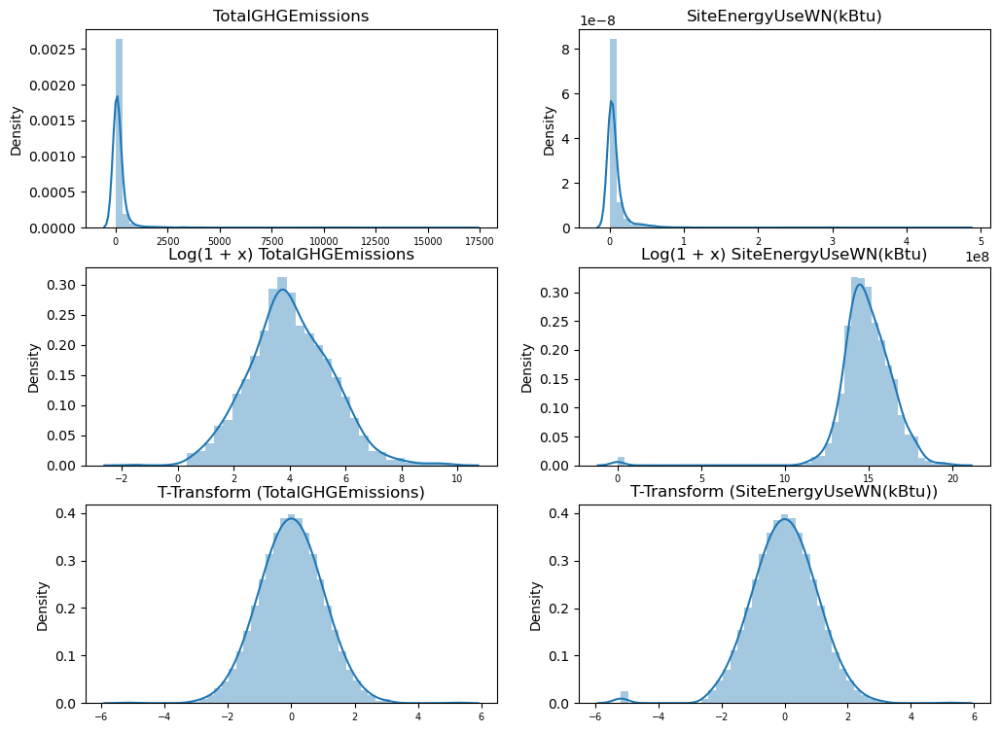

In [124]:
warnings.filterwarnings(action='ignore')
fig = plt.figure(figsize=(12, 9))

from sklearn.preprocessing import quantile_transform

for idx,feat in enumerate(['TotalGHGEmissions','SiteEnergyUseWN(kBtu)']):
    for i,tr in enumerate(['raw','log','quantile_transform']):
        if tr == 'raw':
            ax = fig.add_subplot(3,2, (idx+i+1))
            #h = ax.hist(df_cleaned[feat], bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(df_cleaned[feat],ax=ax).set(title=feat)
            #ax.set_title(feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            ax.set(xlabel='')
            
        if tr == 'log':
            ax = fig.add_subplot(3,2, (idx+i+2))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(np.log1p(df_cleaned[feat]),ax=ax,kde=True).set(title='Log(1 + x) '+feat)
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            ax.set(xlabel='')
            
        if tr == 'quantile_transform':
            ax = fig.add_subplot(3,2, (idx+i+3))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(quantile_transform(df_cleaned[feat].values.reshape(-1, 1), n_quantiles=900, random_state=0, output_distribution="normal", copy=True),ax=ax,kde=True).set(title='T-Transform ('+feat+')')
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)

<div class="alert alert-success">
La transformation de nos variables cibles grace la fonction log1p </br>
nous permet d'obtenir des distribution ressemblante à des courbes en cloche.</div>

In [125]:
df_cleaned[['TotalGHGEmissions','SiteEnergyUseWN(kBtu)']].describe().style.format('{:.3f}')

,TotalGHGEmissions,SiteEnergyUseWN(kBtu)
count,1548.000,1547.000
mean,193.609,8441980.715
std,779.105,22776758.260
min,-0.800,0.000
25%,20.655,1322089.938
50%,49.845,2824096.750
75%,147.227,7470130.000
max,16870.980,471613856.000


In [126]:
pd.cut(df_cleaned['TotalGHGEmissions'],bins=[-1,0,1,10,100,500,1000,5000,10000,17000],include_lowest=True).value_counts()\
.sort_index()

(-1.001, 0.0]           2
(0.0, 1.0]             10
(1.0, 10.0]           194
(10.0, 100.0]         830
(100.0, 500.0]        412
(500.0, 1000.0]        59
(1000.0, 5000.0]       35
(5000.0, 10000.0]       2
(10000.0, 17000.0]      4
Name: TotalGHGEmissions, dtype: int64

In [127]:
pd.cut(df_cleaned['SiteEnergyUseWN(kBtu)'],bins=[-1,1,100000,1000000,10000000,471613856],include_lowest=True).value_counts()\
.sort_index()

(-1.001, 1.0]                  9
(1.0, 100000.0]                4
(100000.0, 1000000.0]        247
(1000000.0, 10000000.0]      997
(10000000.0, 471613856.0]    290
Name: SiteEnergyUseWN(kBtu), dtype: int64

valeurs négatives pour une émissions?

In [128]:
df.loc[df.TotalGHGEmissions<0,["Longitude","Latitude",'Address','PropertyName','SiteEnergyUseWN(kBtu)','TotalGHGEmissions']]

,Longitude,Latitude,Address,PropertyName,SiteEnergyUseWN(kBtu),TotalGHGEmissions
3206,-122.31257,47.61432,1501 E. Madison St.,Bullitt Center,240132.0938,-0.8


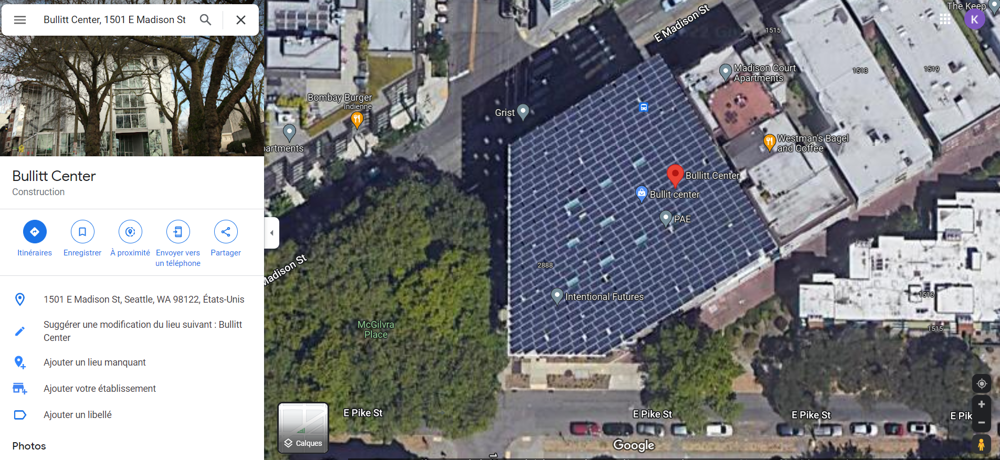

<div class="alert alert-info">
Ce n'est peut etre pas une erreur!!! </br>
Ce batiment est couvert de panneau solaire photovoltaique. </br>
Ce batiment peut donc produire plus qu'elle ne consomme d'énergie, et obtenir un TotalGHGEmissions négatif
Mais dans le cadre du projet celui sera supprimé de notre dataset.
</div>

In [129]:
#df_cleaned.loc[df_cleaned['TotalGHGEmissions']<0,'TotalGHGEmissions'] = 0
df_cleaned = df_cleaned.loc[df_cleaned['TotalGHGEmissions']>0] 

valeurs négatives pour Consommation dNRJ?

In [130]:
#df_cleaned.loc[df_cleaned['SiteEnergyUseWN(kBtu)']<1,'SiteEnergyUseWN(kBtu)'] = np.nan
df_cleaned = df_cleaned.loc[df_cleaned['SiteEnergyUseWN(kBtu)']>1] 

##### NumberofBuildings

In [131]:
df_cleaned.NumberofBuildings.value_counts().sort_index()

0.0       52
1.0     1433
2.0       14
3.0       12
4.0        4
5.0        7
6.0        4
7.0        1
8.0        2
9.0        1
10.0       1
11.0       1
14.0       2
23.0       1
27.0       1
Name: NumberofBuildings, dtype: int64

In [132]:
df.loc[df.NumberofBuildings==df.NumberofBuildings.max()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUseWN(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions
3274,49967,2016,Campus,University,University of Washington - Seattle Campus,NE 45th St & Brooklyn Ave,Seattle,WA,98105.0,1625049001,...,NaN,NaN,NaN,NaN,0.0,False,NaN,Compliant,NaN,11140.56


In [133]:
df.loc[df.NumberofBuildings==df.NumberofBuildings.min(),['BuildingType','PrimaryPropertyType','PropertyName','Address','City','State','ZipCode']]

,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode
63,NonResidential,Medical Office,Polyclinic North && South,1200 Harvard Ave,Seattle,WA,98122.0
76,NonResidential,Small- and Mid-Sized Office,KCTS9,401 Mercer St,Seattle,WA,98109.0
160,NonResidential,Warehouse,Harbor Island: Warehouse E - DNRP-SWD,3235 16TH AVE SW,Seattle,WA,98134.0
201,NonResidential,Large Office,Cox Media Group Seattle KIRO TV (322),2801 3rd Ave,Seattle,WA,98121.0
241,NonResidential,Small- and Mid-Sized Office,University District Office Buiding,1107 NE 45th St,Seattle,WA,98105.0
264,NonResidential,Mixed Use Property,Thaw Building,8300 Military Rd South,Seattle,WA,98108.0
278,NonResidential,Large Office,Fourth and Pike Building,1424 4th Ave,Seattle,WA,98101.0
280,NonResidential,Hotel,Motif Seattle,1414 4th Ave,Seattle,WA,98101.0
291,NonResidential,Other,Meridian (East),1501 7th Ave,Seattle,WA,98101.0
358,Nonresidential COS,Other,Westbridge,4209 W Marginal Way SW,Seattle,WA,98118.0


In [134]:
df_cleaned['NumberofBuildings']=df_cleaned.NumberofBuildings.apply(lambda x: x if x>0 else 1)

##### NumberofFloors

In [135]:
df_cleaned.NumberofFloors.value_counts().sort_index()

0      15
1     422
2     348
3     243
4     139
5     101
6      79
7      32
8      22
9       8
10     18
11     18
12      9
13      7
14      9
15      5
16      3
17      3
18      3
19      5
20      2
21      3
22      3
23      3
24      3
25      3
27      1
28      1
29      3
30      1
33      3
34      2
36      2
37      1
39      1
41      2
42      5
46      1
47      1
49      1
55      1
56      1
63      1
76      1
99      1
Name: NumberofFloors, dtype: int64

In [136]:
df.loc[df.NumberofFloors==df.NumberofFloors.min(),['NumberofFloors','BuildingType','PrimaryPropertyType','PropertyName','Address','City','State','ZipCode']]

,NumberofFloors,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode
166,0,NonResidential,Hotel,Grand Hyatt Seattle,721 Pine St,Seattle,WA,98101.0
487,0,NonResidential,Medical Office,Arnold Pavilion,1221 Madison Street,Seattle,WA,98104.0
488,0,NonResidential,Mixed Use Property,2200 Westlake - SEDO,2200 Westlake Ave.,Seattle,WA,98121.0
564,0,NonResidential,Other,Pacific Place,600 Pine Street,Seattle,WA,98101.0
1754,0,NonResidential,Medical Office,HART First Hill LLC,1124 Columbia Street,Seattle,WA,98104.0
1993,0,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Central Bases,1333 AIRPORT WAY S,Seattle,WA,98134.0
3130,0,NonResidential,Warehouse,Sandpoint #5,7561 63rd Ave NE,Seattle,WA,98115.0
3131,0,NonResidential,Medical Office,Sandpoint #25,6222 NE 74th St,Seattle,WA,98115.0
3132,0,NonResidential,Small- and Mid-Sized Office,Sandpoint #29,6200 NE 74th ST,Seattle,WA,98115.0
3168,0,Nonresidential COS,Other,Magnuson,7400 Sand Point Way NE,Seattle,WA,98115.0


In [137]:
# etage 0 equivaut à un batiment sans etage
df_cleaned['NumberofFloors']=df_cleaned.NumberofFloors.apply(lambda x: x if x>0 else 1)

##### Others

In [138]:
df_cleaned[['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore','Age']].describe()

,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,Age
count,1.536000e+03,1536.000000,1.536000e+03,1.532000e+03,1536.000000,1536.000000,988.000000,1536.000000
mean,1.151233e+05,13747.287760,1.013760e+05,9.378110e+04,19765.118683,3385.048437,63.550607,54.410156
std,1.980514e+05,43721.418098,1.757148e+05,1.628040e+05,52464.570899,18694.113976,28.876540,32.854329
min,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,1.000000
25%,2.881700e+04,0.000000,2.790000e+04,2.500000e+04,0.000000,0.000000,43.750000,27.000000
50%,4.800350e+04,0.000000,4.598550e+04,4.181350e+04,0.000000,0.000000,71.000000,51.000000
75%,1.060102e+05,0.000000,9.491200e+04,9.171750e+04,13557.750000,0.000000,88.000000,86.000000
max,2.200000e+06,512608.000000,2.200000e+06,1.719643e+06,639931.000000,459748.000000,100.000000,116.000000


### <a name="C35"><font color='teal'>3.5 Data Visualisation Multivariée</font></a> 

Box plot
Histogram
Multi-vari chart
Run chart
Pareto chart
Scatter plot (2D/3D)
Stem-and-leaf plot
Parallel coordinates
Odds ratio
Targeted projection pursuit
Heat map
Bar chart

#### <font color='teal'> - 3.5.1 Data target numerique</font>

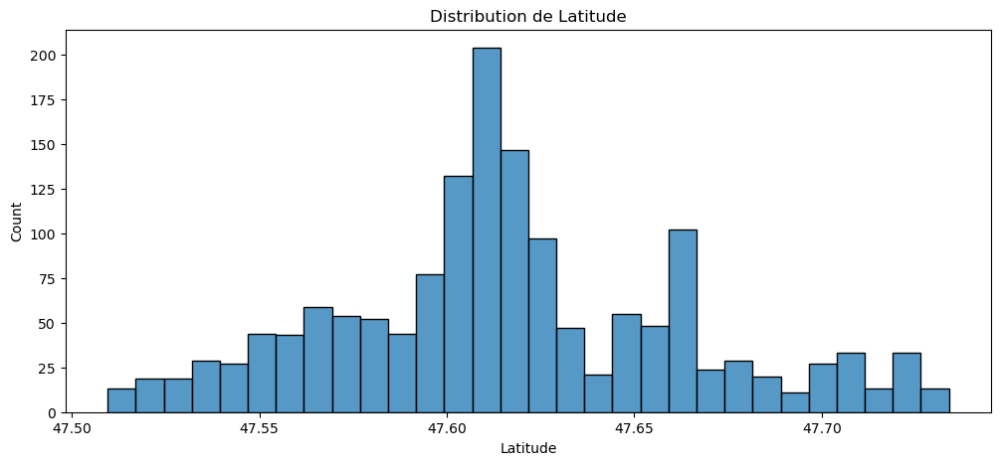

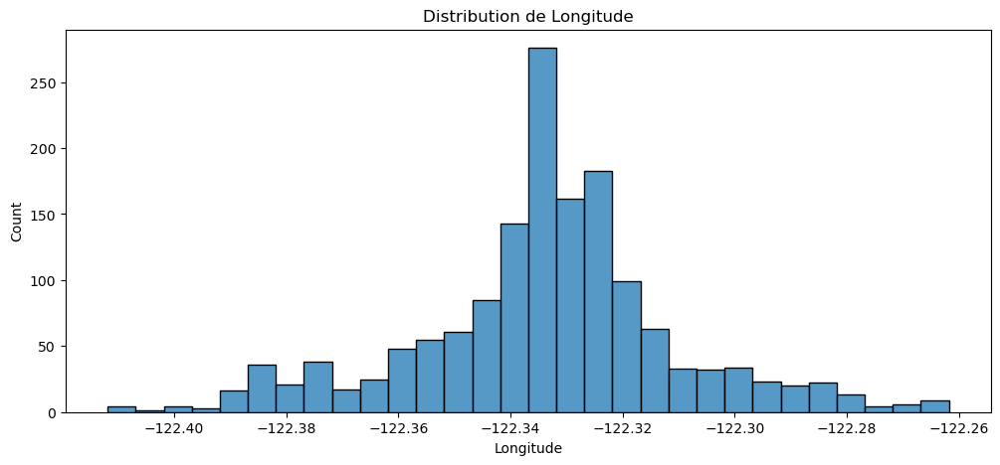

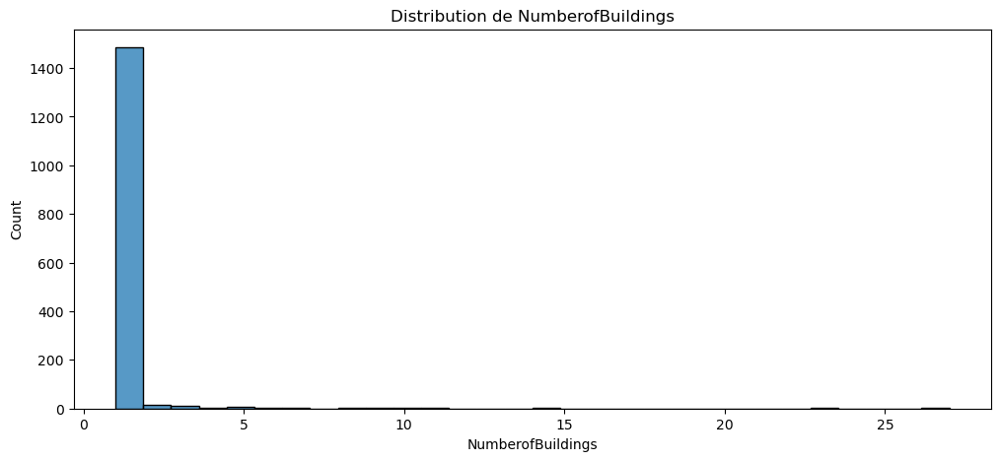

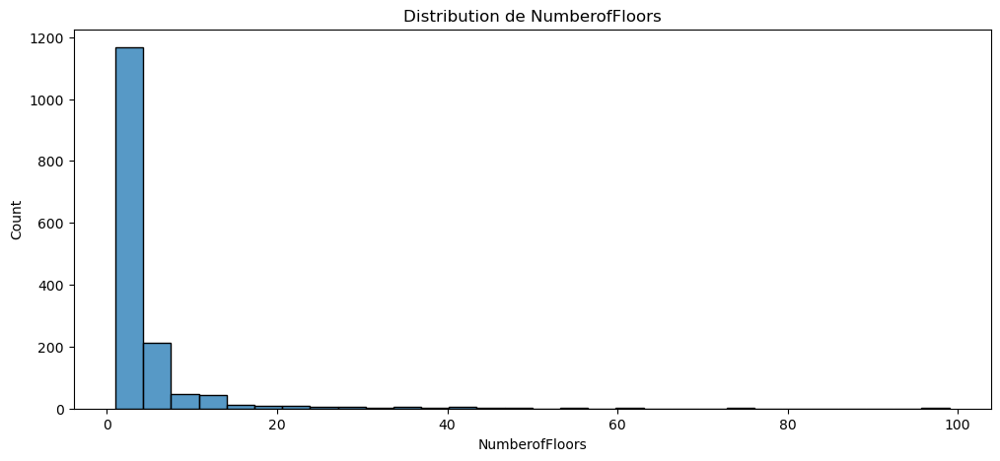

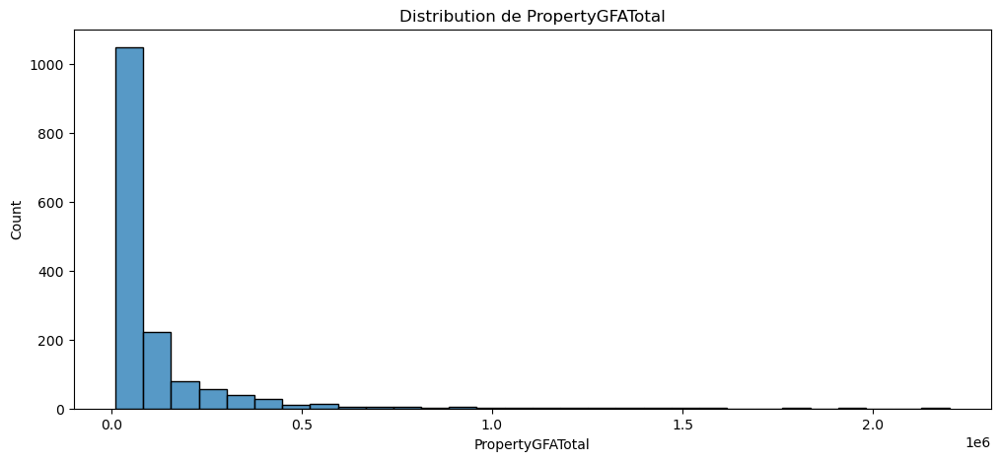

...

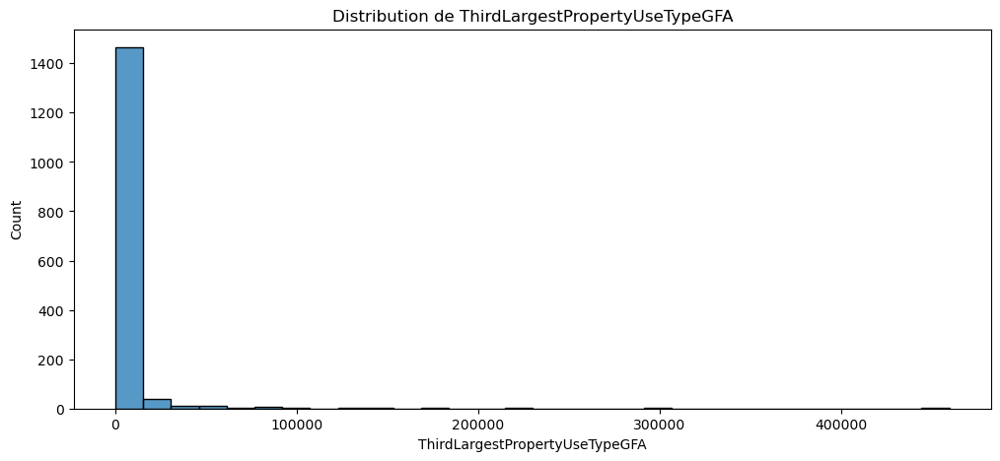

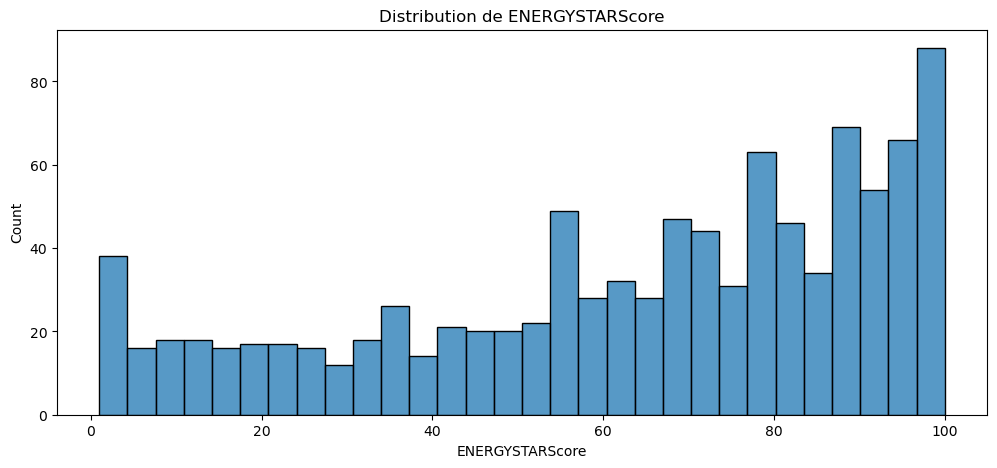

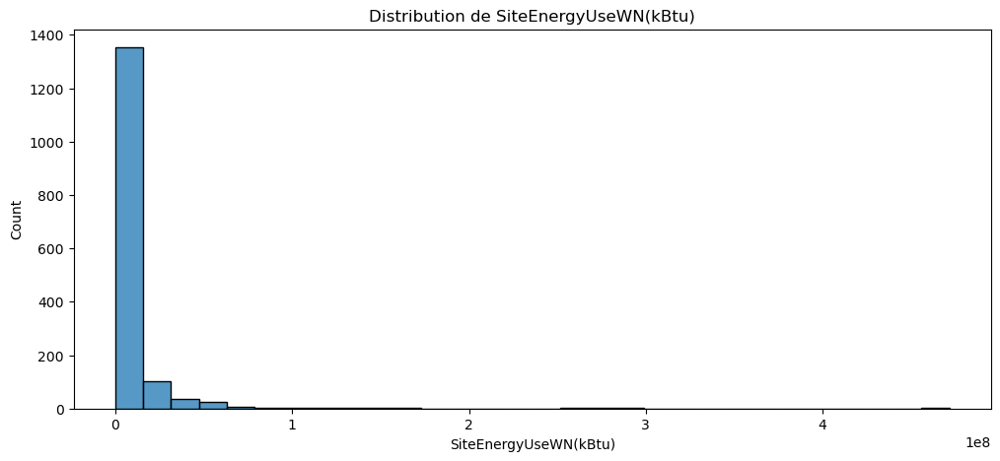

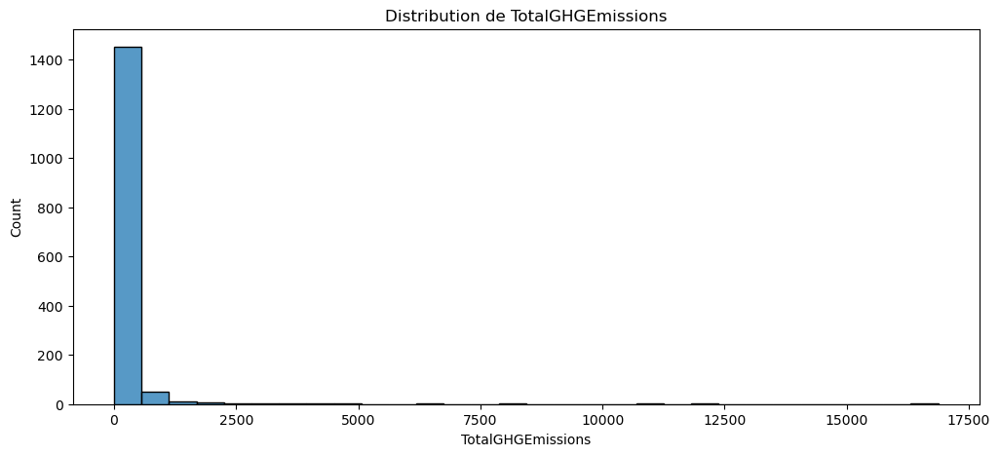

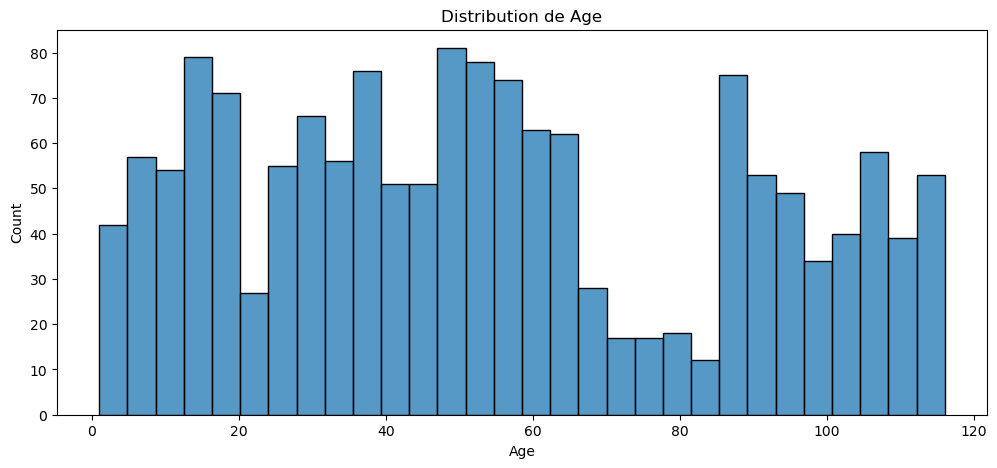

In [139]:
warnings.filterwarnings(action='ignore')
for column in df_cleaned.select_dtypes(np.number).columns:
    plt.figure(figsize=(12,5))
    plt.title('Distribution de ' + column)
    sns.histplot(df_cleaned[column].dropna(), bins=30)

#### <font color='teal'> - 3.5.2 Data target catégorielle</font>

### <a name="C37"><font color='teal'>3.7 Multi Colinéarité</font></a> 

#### <font color='teal'>3.7.a Matrice de Corrélation</font>

In [140]:
# Etude des correlations
df_cleaned.corr()\
.style.background_gradient(cmap = sns.color_palette("blend:white,green", as_cmap=True),axis=None)\
.format('{:.3f}')

,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Age
Latitude,1.000,-0.090,0.004,-0.011,-0.017,0.041,-0.030,-0.021,-0.023,-0.050,0.051,-0.012,-0.009,-0.083
Longitude,-0.090,1.000,-0.000,-0.004,0.013,-0.021,0.020,0.025,0.002,0.010,-0.032,0.035,0.042,-0.017
NumberofBuildings,0.004,-0.000,1.000,-0.027,0.153,-0.015,0.177,0.205,0.066,-0.001,-0.059,0.250,0.250,-0.037
NumberofFloors,-0.011,-0.004,-0.027,1.000,0.649,0.498,0.607,0.612,0.474,0.233,0.149,0.317,0.142,-0.102
PropertyGFATotal,-0.017,0.013,0.153,0.649,1.000,0.592,0.980,0.952,0.753,0.398,0.147,0.592,0.421,-0.215
PropertyGFAParking,0.041,-0.021,-0.015,0.498,0.592,1.000,0.419,0.493,0.494,0.179,0.120,0.205,0.061,-0.290
PropertyGFABuilding(s),-0.030,0.020,0.177,0.607,0.980,0.419,1.000,0.950,0.726,0.404,0.138,0.616,0.460,-0.171
LargestPropertyUseTypeGFA,-0.021,0.025,0.205,0.612,0.952,0.493,0.950,1.000,0.675,0.312,0.129,0.663,0.529,-0.187
SecondLargestPropertyUseTypeGFA,-0.023,0.002,0.066,0.474,0.753,0.494,0.726,0.675,1.000,0.556,0.123,0.596,0.470,-0.214
ThirdLargestPropertyUseTypeGFA,-0.050,0.010,-0.001,0.233,0.398,0.179,0.404,0.312,0.556,1.000,0.016,0.474,0.415,-0.080


Il y a beaucoups de données corrélées.</br>
Simplement car certaines colonnes sont justes des conversion d'autres colonnes en une autre unité. 
</br>
Ex: 1kWh = 1kBtu
suppression une à une

#### <font color='teal'>3.7.b Remove Highly Correlated Features</font>

In [141]:
# Function to list features that are correlated
# Adds the first of the correlated pair only (not both)
def correlatedFeatures(dataset, threshold):
    correlated_columns = set()
    correlations = dataset.corr()
    for i in range(len(correlations)):
        for j in range(i):
            if abs(correlations.iloc[i,j]) > threshold:
                correlated_columns.add(correlations.columns[i]+'_'+correlations.index[j])
    return correlated_columns

In [142]:
# Get a set of correlated features, based on threshold correlation of 0.85
cf = correlatedFeatures(df_cleaned, 0.85)
cf

{'LargestPropertyUseTypeGFA_PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA_PropertyGFATotal',
 'PropertyGFABuilding(s)_PropertyGFATotal',
 'TotalGHGEmissions_SiteEnergyUseWN(kBtu)'}

In [143]:
import scipy
def compute_corr(df):
    """
    Calcul la corrélation entre les colonnes numerique
    retourne un dataset composé de 4 colonnes c1, c2, Corrélation de Pearson Corrélation de Spearman
    """
    df_corr=dict()
    for c1 in df.select_dtypes(include=[np.number]).columns:
        for c2 in df.select_dtypes(include=[np.number]).columns:
            if c1 != c2:
                x = df[[c1,c2]].dropna()[c1].values
                y = df[[c1,c2]].dropna()[c2].values
                df_corr[c1+'_'+c2] = [scipy.stats.pearsonr(x, y)[0] ,
                                   scipy.stats.spearmanr(x, y)[0]]
    result = pd.DataFrame.from_dict(df_corr, orient='index').reset_index()
    result[['Colonne1','Colonne2']] = result['index'].str.split("_",expand=True,)
    result.drop(columns=['index'],inplace=True)
    result.rename(columns={0:'pearson',1:'spearman'},inplace=True)
    
    return result[['Colonne1','Colonne2','pearson','spearman']]

In [144]:
corr_data = compute_corr(df_cleaned)
corr_data.loc[(corr_data.pearson>=0.9) | (corr_data.spearman>=0.9)].sort_values('pearson')

,Colonne1,Colonne2,pearson,spearman
154,SiteEnergyUseWN(kBtu),TotalGHGEmissions,0.921564,0.878762
167,TotalGHGEmissions,SiteEnergyUseWN(kBtu),0.921564,0.878762
84,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.950280,0.917364
97,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.950280,0.917364
58,PropertyGFATotal,LargestPropertyUseTypeGFA,0.951934,0.920615
95,LargestPropertyUseTypeGFA,PropertyGFATotal,0.951934,0.920615
57,PropertyGFATotal,PropertyGFABuilding(s),0.979704,0.978020
82,PropertyGFABuilding(s),PropertyGFATotal,0.979704,0.978020


In [145]:
print('Notre dataset est de dimension ',df_cleaned.shape)

Notre dataset est de dimension  (1536, 24)


# <a name="C4"><font color='green'>**Partie 4 : Cleaning**</font></a> 

In [146]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
FifthLargestPropertyUseType,100.00,0
FourthLargestPropertyUseType,100.00,0
TotalGHGEmissions,100.00,0
SiteEnergyUseWN(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
SixthLargestPropertyUseType,100.00,0


### <a name="C41"><font color='green'>4.1 Imputer Missing Data </font></a> 

### <a name="C43"><font color='green'>4.3 Export csv</font></a> 

In [147]:
#### data_cleaned without encoding

In [148]:
path_clean = 'data/cleaned/'
filename_clean = 'df_cleaned.csv'
df_cleaned.to_csv(path_clean+filename_clean,index=True,sep=';')

In [149]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
FifthLargestPropertyUseType,100.00,0
FourthLargestPropertyUseType,100.00,0
TotalGHGEmissions,100.00,0
SiteEnergyUseWN(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
SixthLargestPropertyUseType,100.00,0


</br>

</br>

</br>